## Dependencies

In [177]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import f1_score
from sklearn.inspection import permutation_importance

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pickle

In [178]:
import shap
shap.initjs()

import warnings
warnings.filterwarnings('ignore')

In [179]:
plt.rcParams.update({'figure.dpi': 300, 'font.size': 10})

## Dataset

In [180]:
# reading in the heart disease dataset
df = pd.read_csv('../data/heart_disease_dataset.csv')

display(df)

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num,location
0,63.0,Male,Typical Angina,145.0,233.0,Above 120,LV Hypertrophy,150.0,Exercise Angina Absent,2.3,Down,0 Vessel(s),Fixed Defect,0,Cleveland
1,67.0,Male,Asymptomatic,160.0,286.0,Below 120,LV Hypertrophy,108.0,Exercise Angina Present,1.5,Flat,3 Vessel(s),Normal,1,Cleveland
2,67.0,Male,Asymptomatic,120.0,229.0,Below 120,LV Hypertrophy,129.0,Exercise Angina Present,2.6,Flat,2 Vessel(s),Reversable Defect,1,Cleveland
3,37.0,Male,Nonanginal Pain,130.0,250.0,Below 120,Normal,187.0,Exercise Angina Absent,3.5,Down,0 Vessel(s),Normal,0,Cleveland
4,41.0,Female,Atypical Angina,130.0,204.0,Below 120,LV Hypertrophy,172.0,Exercise Angina Absent,1.4,Up,0 Vessel(s),Normal,0,Cleveland
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
792,54.0,Female,Asymptomatic,127.0,333.0,Above 120,ST-T Abnormality,154.0,Exercise Angina Absent,0.0,NaN,NaN,NaN,1,Long Beach
793,62.0,Male,Typical Angina,NaN,139.0,Below 120,ST-T Abnormality,NaN,NaN,NaN,NaN,NaN,NaN,0,Long Beach
794,55.0,Male,Asymptomatic,122.0,223.0,Above 120,ST-T Abnormality,100.0,Exercise Angina Absent,0.0,NaN,NaN,Fixed Defect,1,Long Beach
795,58.0,Male,Asymptomatic,NaN,385.0,Above 120,LV Hypertrophy,NaN,NaN,NaN,NaN,NaN,NaN,0,Long Beach


In [181]:
# initializing the feature matrix and target vector
X = df.drop(['num'], axis=1)
y = df['num']

# initializing the class ratios of the target variable
target_ratios = y.value_counts(normalize=True)

# printing the baseline accuracy of the dataset
baseline_accuracy = target_ratios.max()
print(f'Baseline Accuracy: {baseline_accuracy:.2%}')

Baseline Accuracy: 50.56%


## Functions

In [182]:
# defining the overall_test_results function
def overall_test_results(best_models, test_sets, model_id):
    # initializing empty dataframes
    test_results = pd.DataFrame()
    
    y_true = pd.DataFrame()
    y_pred = pd.DataFrame()
    
    # looping through the test sets
    for i in range(len(test_sets)):
        # initializing the best model for the current trial
        processor = best_models[i].named_steps['columntransformer']
        estimator = best_models[i].named_steps[model_id]

        # concatenating the current test set with the dataframes
        test_results = pd.concat([test_results, test_sets[i][0]], ignore_index=True)
        
        y_true = pd.concat([y_true, test_sets[i][1]], ignore_index=True)
        y_pred = pd.concat([y_pred, pd.Series(estimator.predict(processor.transform(test_sets[i][0])))], ignore_index=True)
    
    # initializing the true labels and pred labels
    test_results['y true'] = y_true
    test_results['y pred'] = y_pred
    
    # returning the overall test results of the model
    return test_results

In [183]:
# defining the plot_confusion function
def plot_confusion(true, pred, labels, model_name, scorer):
    # initializing the confusion matrix display
    cm = confusion_matrix(true, pred, normalize='true')
    cmd = ConfusionMatrixDisplay(cm, display_labels=labels)

    # plotting the estimator confusion matrix
    cmd.plot()

    # setting the plot title and axis labels
    model_title = model_name.replace('_', ' ').title()
    cmd.ax_.set_title(f'{model_title} Confusion Matrix', pad=15)
    
    cmd.ax_.set_xlabel('Predicted Label', labelpad=10)
    cmd.ax_.set_ylabel('True Label', labelpad=10)

    cmd.im_.set_clim(0, 1)

    plt.savefig(f'../figures/evaluation_figures/{model_name}/confusion_matrix_{scorer}.png', bbox_inches='tight')

    plt.show()

In [184]:
# defining the plot_permutation_im function
def plot_permutation_im(estimator, X, y, model_name, scorer):
    # initializing the permutation importance scores
    results = permutation_importance(estimator, X, y, n_repeats=10, random_state=0)
    scores = results.importances

    sorted_indices = np.argsort(np.mean(scores, axis=1))[-10:]

    # plotting the top 10 most important features by feature importance
    plt.boxplot(scores[sorted_indices].T, labels=feature_names[sorted_indices], vert=False)

    model_title = model_name.replace('_', ' ').title()
    plt.title(f'{model_title} Permutation Feature Importance', pad=15)

    plt.xlabel('Change In Test Score', labelpad=10)
    plt.ylabel('Feature')

    plt.savefig(f'../figures/evaluation_figures/{model_name}/permutation_global_{scorer}.png', bbox_inches='tight')

    plt.show()

In [185]:
# defining the plot_coefficient_im function
def plot_coefficient_im(estimator, feature_names, model_name, scorer):
    # initializing the estimator coefficients
    coefficients = estimator.coef_[0]
    sorted_indices = np.argsort(np.abs(coefficients))

    # plotting the top 10 most important features by coefficient
    plt.barh(np.arange(10), coefficients[sorted_indices[-10:]])

    model_title = model_name.replace('_', ' ').title()
    plt.title(f'{model_title} Coefficient Feature Importance', pad=15)

    plt.yticks(np.arange(10), feature_names[sorted_indices[-10:]])

    plt.xlabel('Coefficient', labelpad=10)
    plt.ylabel('Feature')

    plt.savefig(f'../figures/evaluation_figures/{model_name}/coefficient_global_{scorer}.png', bbox_inches='tight')

    plt.show()

In [186]:
# defining the plot_feature_importances function
def plot_feature_importances(estimator, feature_names, model_name, scorer):
    # plotting importance based on the decrease in node impurity
    global_importances = pd.Series(estimator.feature_importances_, index=feature_names)
    
    global_importances.sort_values(ascending=True, inplace=True)
    global_importances[-10:].plot.barh()

    model_title = model_name.replace('_', ' ').title()
    plt.title(f'{model_title} Node Impurity Feature Importance')

    plt.xlabel('Change In Impurity')
    plt.ylabel('Feature')

    plt.savefig(f'../figures/evaluation_figures/{model_name}/built_in_{scorer}.png', bbox_inches='tight')
    
    plt.show()

In [187]:
# defining the plot_shap_global_im_s function
def plot_shap_global_im_s(X, shap_values, feature_names, model_name, scorer):
    # plotting a summary plot for the shap values
    shap.summary_plot(shap_values, X, feature_names=feature_names, max_display=10, show=False)

    model_title = model_name.replace('_', ' ').title()
    plt.title(f'{model_title} SHAP Feature Importance', pad=15)

    plt.xlabel('SHAP Value', labelpad=10)
    plt.ylabel('Feature')

    plt.savefig(f'../figures/evaluation_figures/{model_name}/shap_global_{scorer}.png', bbox_inches='tight')

    plt.show()

In [188]:
# defining the plot_shap_global_im_m function
def plot_shap_global_im_m(X, shap_values, feature_names, model_name, scorer):
    # plotting a summary plot for the shap values
    shap.summary_plot(shap_values[0], X, feature_names=feature_names, max_display=10, show=False)

    model_title = model_name.replace('_', ' ').title()
    plt.title(f'{model_title} SHAP Feature Importance', pad=15)

    plt.xlabel('SHAP Value', labelpad=10)
    plt.ylabel('Feature')

    plt.savefig(f'../figures/evaluation_figures/{model_name}/shap_global_{scorer}.png', bbox_inches='tight')

    plt.show()

In [189]:
# defining the plot_xgboost_metrics_im function
def plot_xgboost_metrics_im(estimator, metrics, feature_names, model_name, scorer):
    # iterating through the XGBoost feature importance metrics
    for metric in metrics:
        # calculating the scores for the current metric
        scores = estimator.get_booster().get_score(importance_type=metric)
        scores = dict(zip(feature_names, scores.values()))
    
        scores = {k: v for k, v in sorted(scores.items(), key=lambda item: item[1])}

        # plotting the top 10 most important features by metric
        plt.barh(list(scores.keys())[-10:], list(scores.values())[-10:])

        metric_name = metric.replace('_', ' ').title()
        plt.title(f'{metric_name} Feature Importance')

        plt.xlabel('Metric Score')
        plt.ylabel('Feature')

        plt.savefig(f'../figures/evaluation_figures/{model_name}/{metric}_{scorer}.png', bbox_inches='tight')
        
        plt.show()

## Logistic Regression

In [190]:
# initializing the model name
model_name = 'logistic_regression'

### Accuracy Score

In [191]:
# initializing the scorer
scorer = 'a'

In [192]:
# initializing the logistic regression results
with open('../results/logistic_regression/logistic_regression_a.pkl', 'rb') as f:
    lr_results_a = pickle.load(f)

# initializing the best logistic regression model
best_index = np.argmax(lr_results_a['test scores'])
best_model = lr_results_a['best models'][best_index]

processor = best_model.named_steps['columntransformer']
estimator = best_model.named_steps['logisticregression']

In [193]:
print(processor)

ColumnTransformer(transformers=[('cat',
                                 Pipeline(steps=[('onehot',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False)),
                                                 ('scaler1',
                                                  StandardScaler())]),
                                 ['sex', 'cp', 'fbs', 'restecg', 'exang',
                                  'slope', 'ca', 'thal', 'location']),
                                ('num',
                                 Pipeline(steps=[('imputer',
                                                  IterativeImputer(estimator=LinearRegression(),
                                                                   random_state=0)),
                                                 ('scaler2',
                                                  StandardScaler())]),
                                

In [194]:
print(estimator)

LogisticRegression(C=0.015848931924611124, max_iter=10000, random_state=0,
                   solver='saga')


In [195]:
# initializing the overall test results of the logistic regression model
lr_test_results_a = overall_test_results(lr_results_a['best models'], lr_results_a['test sets'], 'logisticregression')

y_true = lr_test_results_a['y true']
y_pred = lr_test_results_a['y pred']

In [196]:
# saving the overall test predictions of the logistic regression model
y_pred.to_csv(f'../results/{model_name}/{model_name}_prediction_{scorer}.csv', index=False)

#### Confusion Matrix

Accuracy Score: 0.74


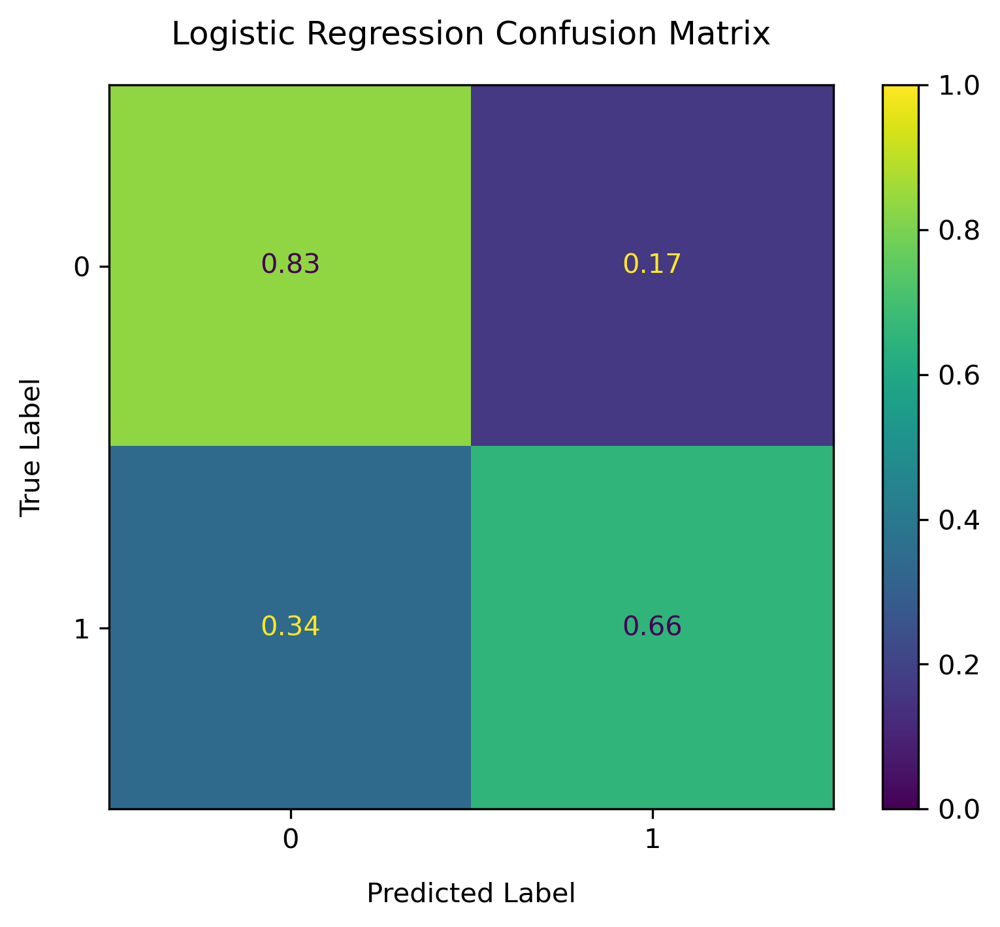

In [197]:
# printing the accuracy of the overall logistic regression prediction
print(f'Accuracy Score: {accuracy_score(y_true, y_pred):.2}')

# plotting the overall logistic regression prediction confusion matrix
plot_confusion(y_true, y_pred, [0, 1], model_name, scorer)

#### Best Test Set

In [198]:
# initializing the test feature matrix and target vector
X_test = processor.transform(lr_results_a['test sets'][best_index][0])
X_test = pd.DataFrame(data=X_test, columns=processor.get_feature_names_out())

y_test = lr_results_a['test sets'][best_index][1]

In [199]:
# initializing the feature names
feature_names = X_test.columns

#### Permutation

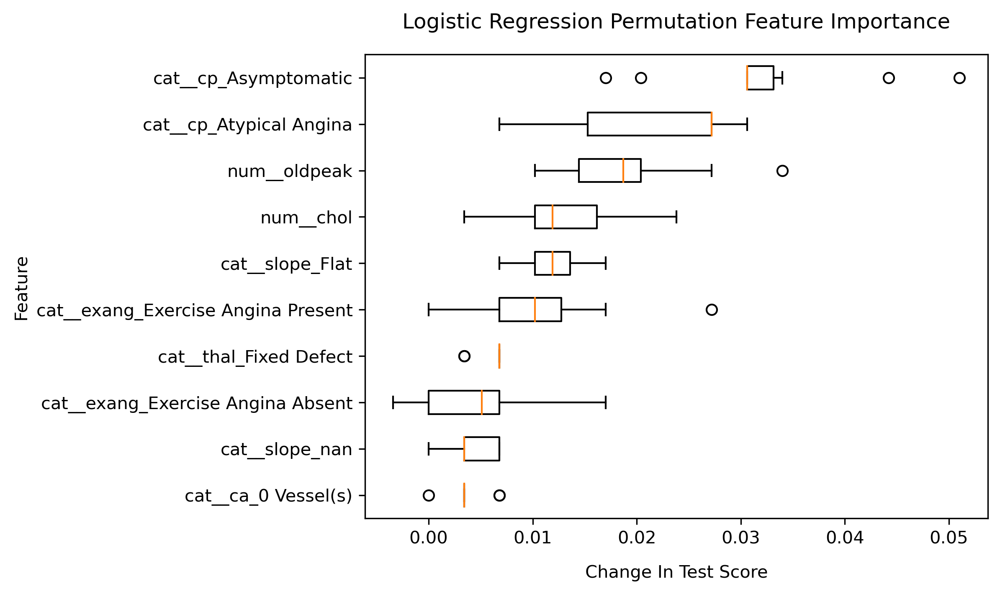

In [200]:
# plotting the top 10 most important features by feature importance
plot_permutation_im(estimator, X_test.to_numpy(), y_test.to_numpy(), model_name, scorer)

#### Coefficient

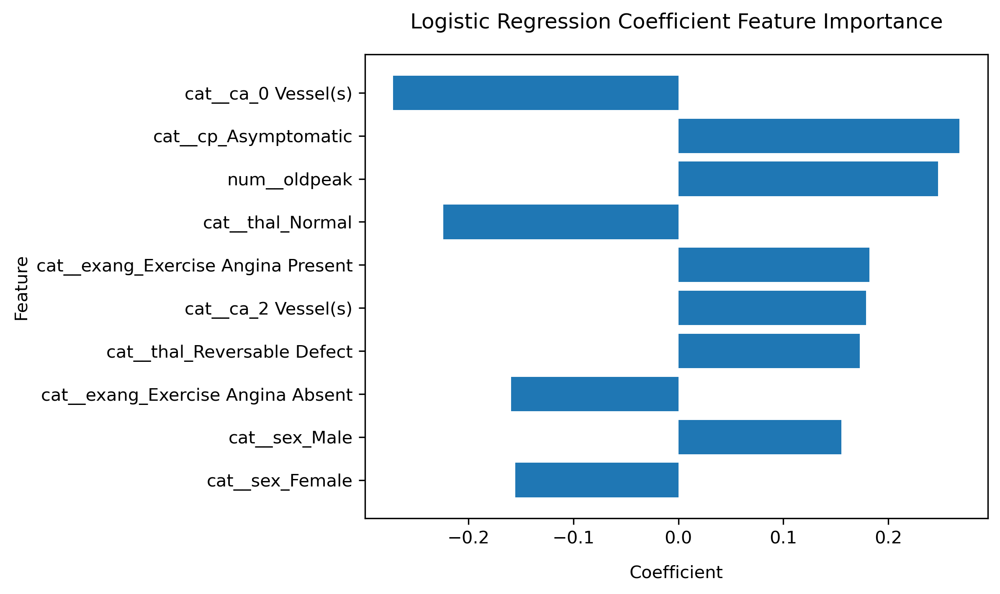

In [201]:
# plotting the top 10 most important features by coefficient
plot_coefficient_im(estimator, feature_names, model_name, scorer)

#### SHAP Global

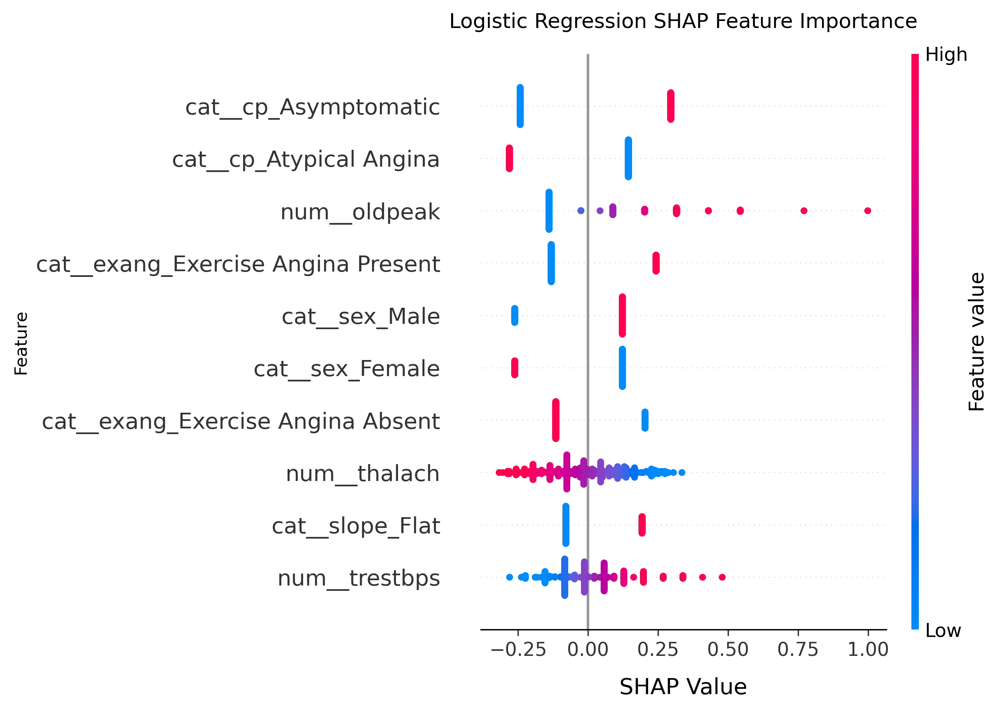

In [202]:
# initializing the shap explainer
explainer = shap.LinearExplainer(estimator, X_test)

# calculating the shap values
shap_values = explainer.shap_values(X_test)

# plotting a summary plot for the shap values
plot_shap_global_im_s(X_test, shap_values, feature_names, model_name, scorer)

#### SHAP Local

In [203]:
# printing the expected value of the explainer
print(f'Base Value: {explainer.expected_value:.2}')

Base Value: 0.13


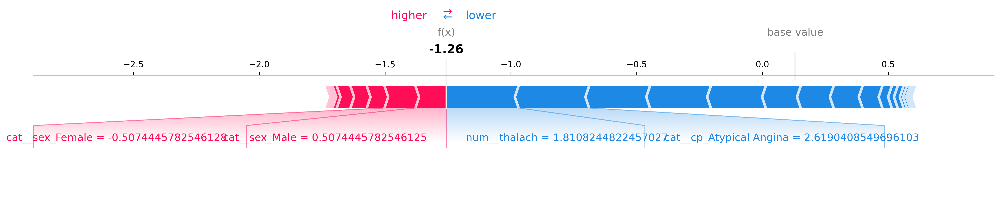

In [204]:
# initializing the index of the data point
index = 0

# plotting a force plot for the data point at the initialized index
shap.force_plot(explainer.expected_value, shap_values[index, :], features=X_test.iloc[index, :], feature_names=feature_names, 
                show=False, matplotlib=True).savefig(f'../figures/evaluation_figures/{model_name}/shap_{index}_{scorer}.png', bbox_inches='tight')

plt.show()

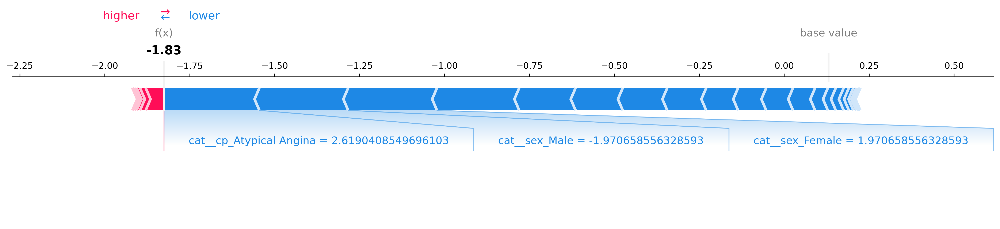

In [205]:
# initializing the index of the data point
index = 60

# plotting a force plot for the data point at the initialized index
shap.force_plot(explainer.expected_value, shap_values[index, :], features=X_test.iloc[index, :], feature_names=feature_names, 
                show=False, matplotlib=True).savefig(f'../figures/evaluation_figures/{model_name}/shap_{index}_{scorer}.png', bbox_inches='tight')

plt.show()

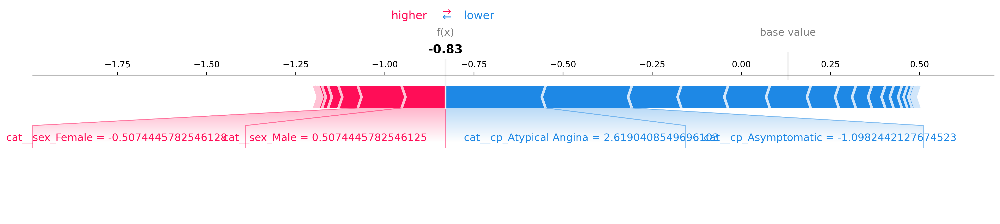

In [206]:
# initializing the index of the data point
index = 120

# plotting a force plot for the data point at the initialized index
shap.force_plot(explainer.expected_value, shap_values[index, :], features=X_test.iloc[index, :], feature_names=feature_names, 
                show=False, matplotlib=True).savefig(f'../figures/evaluation_figures/{model_name}/shap_{index}_{scorer}.png', bbox_inches='tight')

plt.show()

### F1 Score

In [207]:
# initializing the scorer
scorer = 'f'

In [208]:
# initializing the logistic regression results
with open('../results/logistic_regression/logistic_regression_f.pkl', 'rb') as f:
    lr_results_f = pickle.load(f)

# initializing the best logistic regression model
best_index = np.argmax(lr_results_f['test scores'])
best_model = lr_results_f['best models'][best_index]

processor = best_model.named_steps['columntransformer']
estimator = best_model.named_steps['logisticregression']

In [209]:
print(processor)

ColumnTransformer(transformers=[('cat',
                                 Pipeline(steps=[('onehot',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False)),
                                                 ('scaler1',
                                                  StandardScaler())]),
                                 ['sex', 'cp', 'fbs', 'restecg', 'exang',
                                  'slope', 'ca', 'thal', 'location']),
                                ('num',
                                 Pipeline(steps=[('imputer',
                                                  IterativeImputer(estimator=LinearRegression(),
                                                                   random_state=0)),
                                                 ('scaler2',
                                                  StandardScaler())]),
                                

In [210]:
print(estimator)

LogisticRegression(C=0.01, max_iter=10000, random_state=0, solver='saga')


In [211]:
# initializing the overall test results of the logistic regression model
lr_test_results_f = overall_test_results(lr_results_f['best models'], lr_results_f['test sets'], 'logisticregression')

y_true = lr_test_results_f['y true']
y_pred = lr_test_results_f['y pred']

In [212]:
# saving the overall test predictions of the logistic regression model
y_pred.to_csv(f'../results/{model_name}/{model_name}_prediction_{scorer}.csv', index=False)

#### Confusion Matrix

F1 Score: 0.73


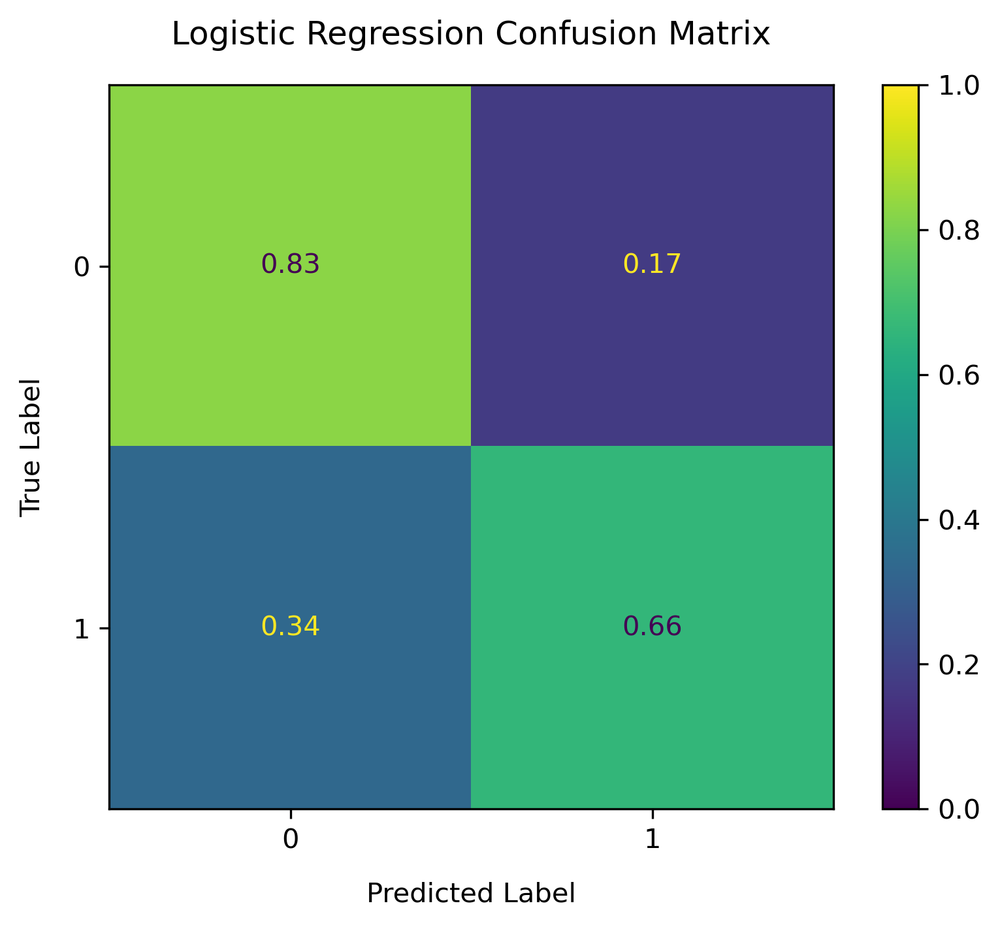

In [213]:
# printing the accuracy of the overall logistic regression prediction
print(f'F1 Score: {f1_score(y_true, y_pred):.2}')

# plotting the overall logistic regression prediction confusion matrix
plot_confusion(y_true, y_pred, [0, 1], model_name, scorer)

#### Test Set

In [214]:
# initializing the test feature matrix and target vector
X_test = processor.transform(lr_results_f['test sets'][best_index][0])
X_test = pd.DataFrame(data=X_test, columns=processor.get_feature_names_out())

y_test = lr_results_f['test sets'][best_index][1]

In [215]:
# initializing the feature names
feature_names = X_test.columns

#### Permutation

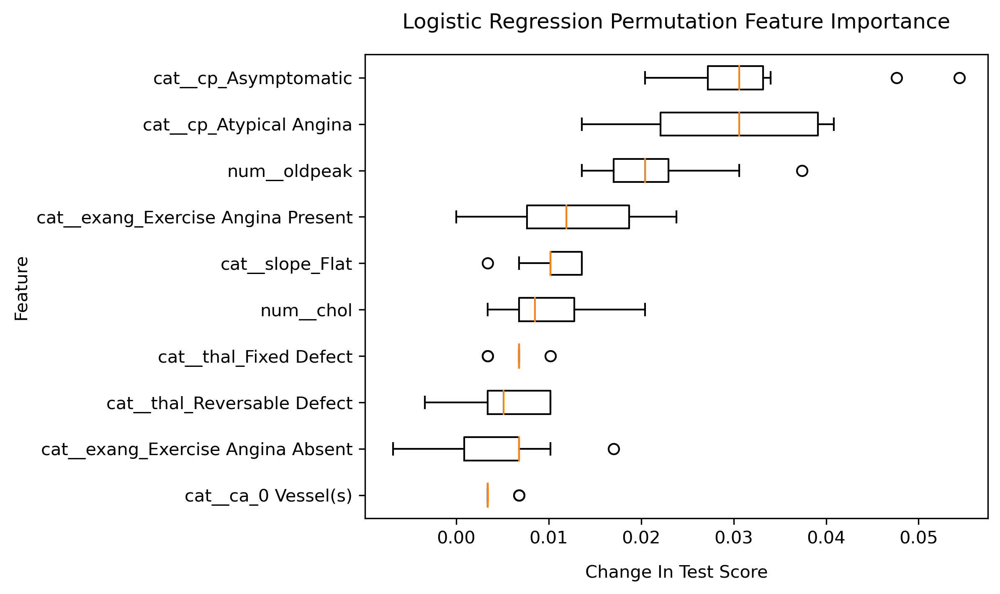

In [216]:
# plotting the top 10 most important features by feature importance
plot_permutation_im(estimator, X_test.to_numpy(), y_test.to_numpy(), model_name, scorer)

#### Coefficient

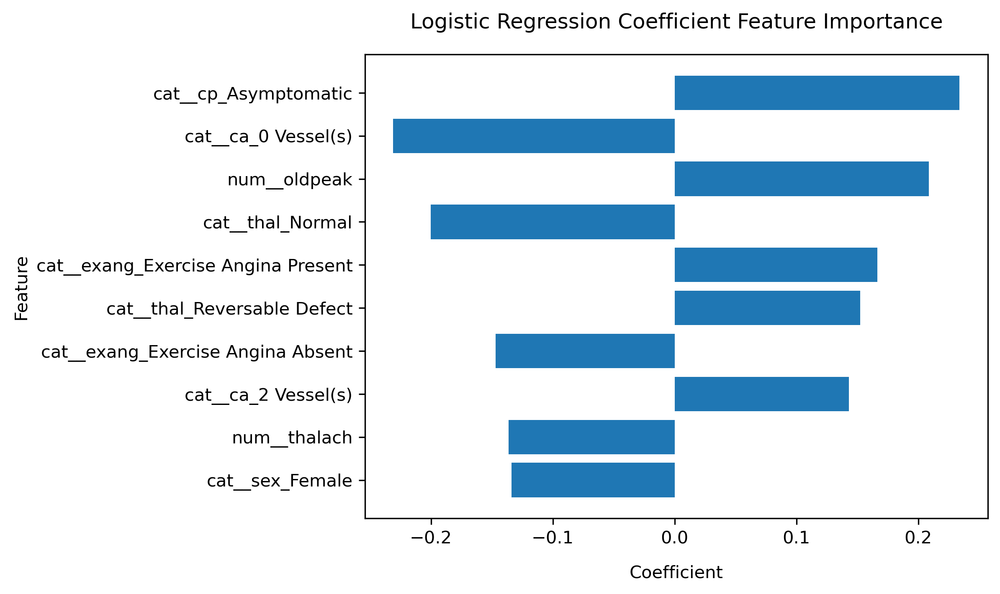

In [217]:
# plotting the top 10 most important features by coefficient
plot_coefficient_im(estimator, feature_names, model_name, scorer)

#### SHAP Global

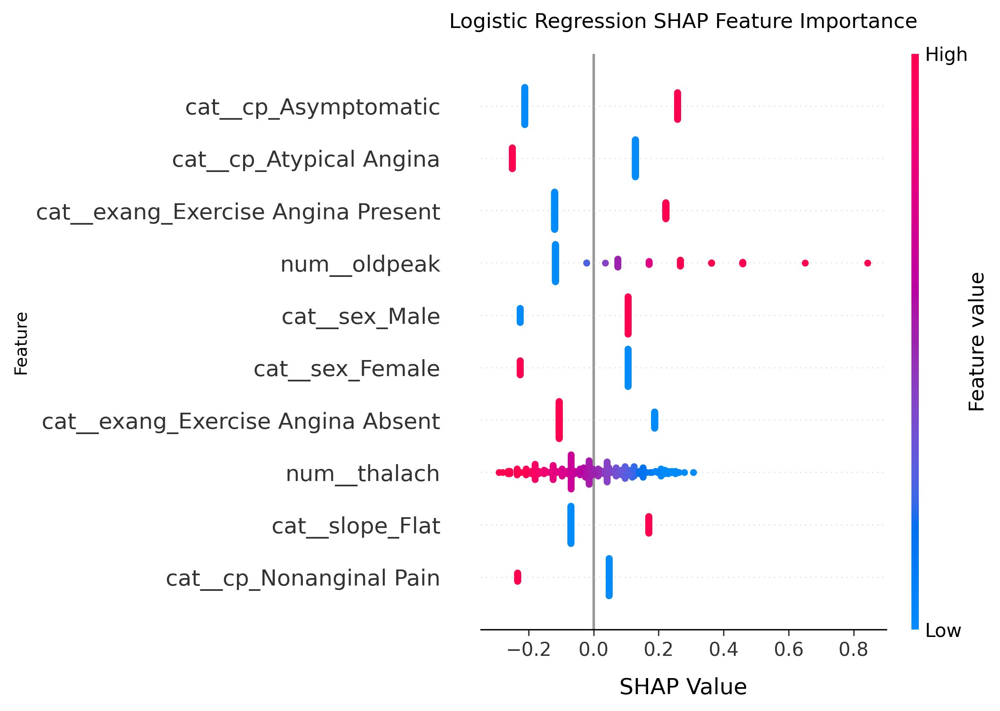

In [218]:
# initializing the shap explainer
explainer = shap.LinearExplainer(estimator, X_test)

# calculating the shap values
shap_values = explainer.shap_values(X_test)

# plotting a summary plot for the shap values
plot_shap_global_im_s(X_test, shap_values, feature_names, model_name, scorer)

#### SHAP Local

In [219]:
# printing the expected value of the explainer
print(f'Base Value: {explainer.expected_value:.2}')

Base Value: 0.17


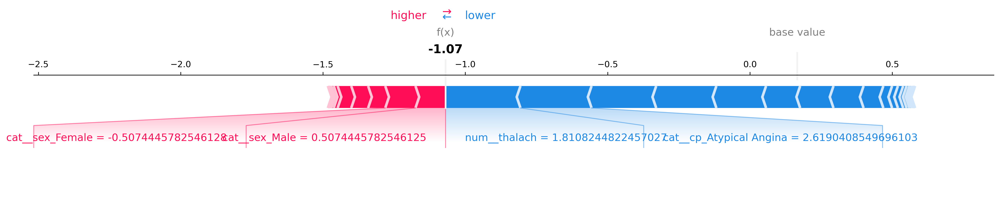

In [220]:
# initializing the index of the data point
index = 0

# plotting a force plot for the data point at the initialized index
shap.force_plot(explainer.expected_value, shap_values[index, :], features=X_test.iloc[index, :], feature_names=feature_names, 
                show=False, matplotlib=True).savefig(f'../figures/evaluation_figures/{model_name}/shap_{index}_{scorer}.png', bbox_inches='tight')

plt.show()

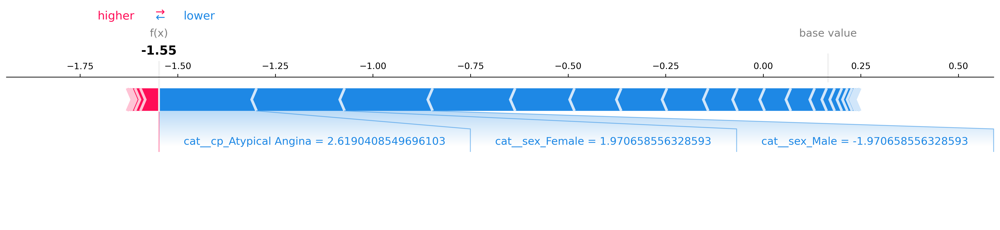

In [221]:
# initializing the index of the data point
index = 60

# plotting a force plot for the data point at the initialized index
shap.force_plot(explainer.expected_value, shap_values[index, :], features=X_test.iloc[index, :], feature_names=feature_names, 
                show=False, matplotlib=True).savefig(f'../figures/evaluation_figures/{model_name}/shap_{index}_{scorer}.png', bbox_inches='tight')

plt.show()

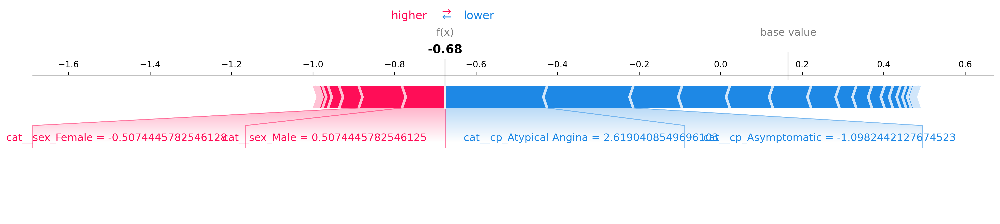

In [222]:
# initializing the index of the data point
index = 120

# plotting a force plot for the data point at the initialized index
shap.force_plot(explainer.expected_value, shap_values[index, :], features=X_test.iloc[index, :], feature_names=feature_names, 
                show=False, matplotlib=True).savefig(f'../figures/evaluation_figures/{model_name}/shap_{index}_{scorer}.png', bbox_inches='tight')

plt.show()

## Random Forest

In [223]:
# initializing the model name
model_name = 'random_forest'

### Accuracy Score

In [224]:
# initializing the scorer
scorer = 'a'

In [225]:
# initializing the random forest results
with open('../results/random_forest/random_forest_a.pkl', 'rb') as f:
    rf_results_a = pickle.load(f)

# initializing the best random forest model
best_index = np.argmax(rf_results_a['test scores'])
best_model = rf_results_a['best models'][best_index]

processor = best_model.named_steps['columntransformer']
estimator = best_model.named_steps['randomforestclassifier']

In [226]:
print(processor)

ColumnTransformer(transformers=[('cat',
                                 Pipeline(steps=[('onehot',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False))]),
                                 ['sex', 'cp', 'fbs', 'restecg', 'exang',
                                  'slope', 'ca', 'thal', 'location']),
                                ('num',
                                 Pipeline(steps=[('imputer',
                                                  IterativeImputer(estimator=LinearRegression(),
                                                                   random_state=0)),
                                                 ('scaler', StandardScaler())]),
                                 ['age', 'trestbps', 'chol', 'thalach',
                                  'oldpeak'])])


In [227]:
print(estimator)

RandomForestClassifier(max_depth=30, max_features=0.25, random_state=0)


In [228]:
# initializing the overall test results of the random forest model
rf_test_results_a = overall_test_results(rf_results_a['best models'], rf_results_a['test sets'], 'randomforestclassifier')

y_true = rf_test_results_a['y true']
y_pred = rf_test_results_a['y pred']

In [229]:
# saving the overall test predictions of the random forest model
y_pred.to_csv(f'../results/{model_name}/{model_name}_prediction_{scorer}.csv', index=False)

#### Confusion Matrix

Accuracy Score: 0.77


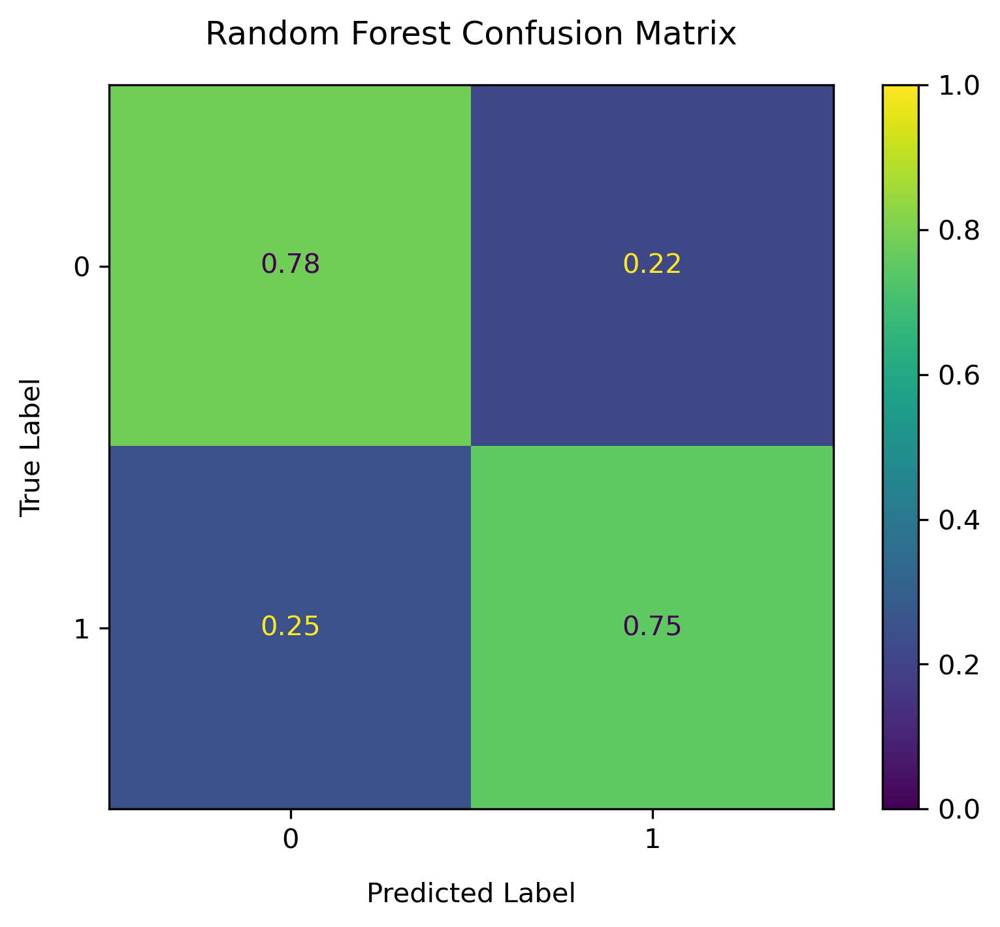

In [230]:
# printing the accuracy of the overall random forest prediction
print(f'Accuracy Score: {accuracy_score(y_true, y_pred):.2}')

# plotting the overall random forest prediction confusion matrix
plot_confusion(y_true, y_pred, [0, 1], model_name, scorer)

#### Test Set

In [231]:
# initializing the test feature matrix and target vector
X_test = processor.transform(rf_results_a['test sets'][best_index][0])
X_test = pd.DataFrame(data=X_test, columns=processor.get_feature_names_out())

y_test = rf_results_a['test sets'][best_index][1]

In [232]:
# initializing the feature names
feature_names = X_test.columns

#### Permutation

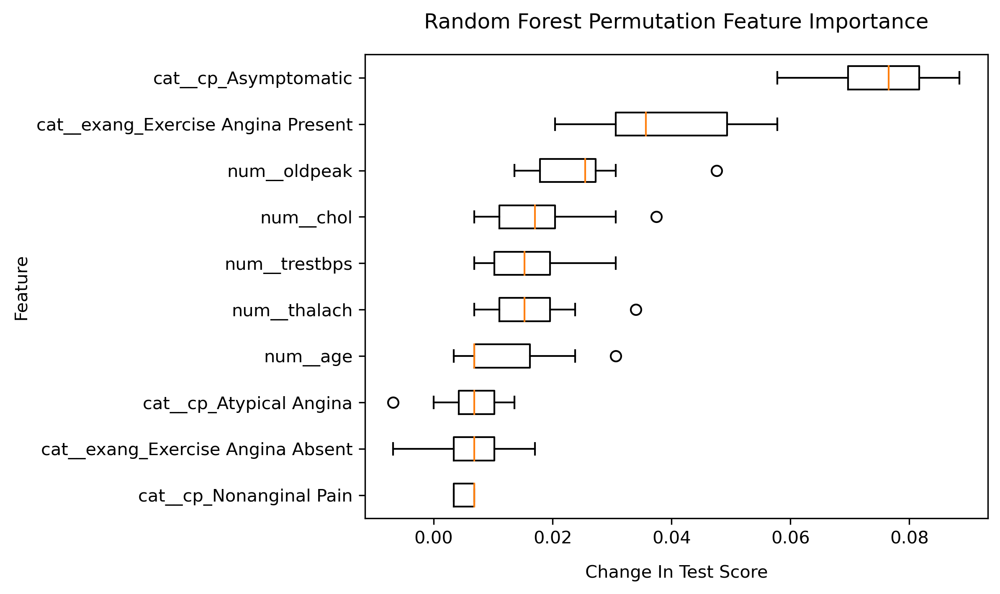

In [233]:
# plotting the top 10 most important features by feature importance
plot_permutation_im(estimator, X_test.to_numpy(), y_test.to_numpy(), model_name, scorer)

#### Node Impurity

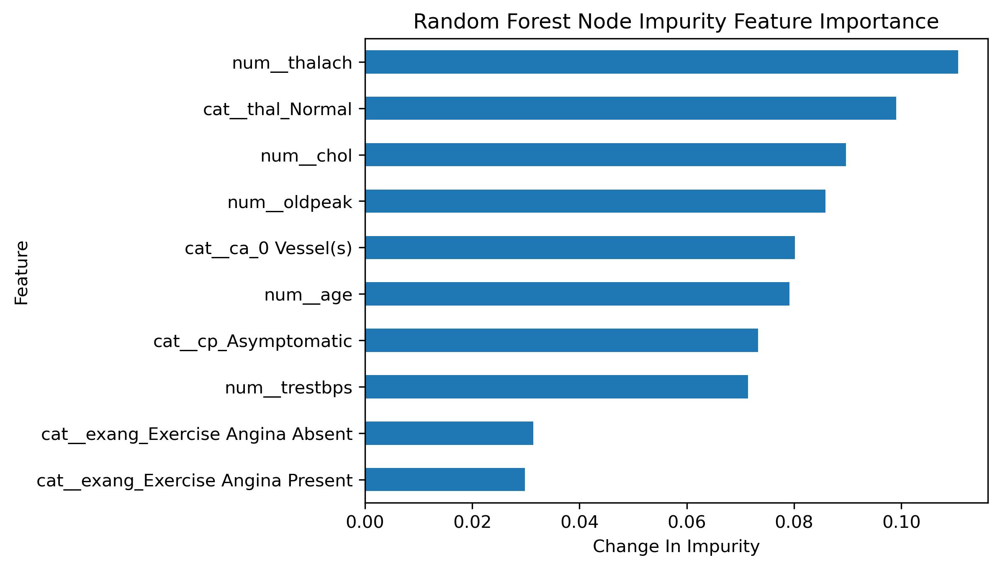

In [234]:
# plotting the top 10 most important features by node impurity
plot_feature_importances(estimator, feature_names, model_name, scorer)

#### SHAP Global

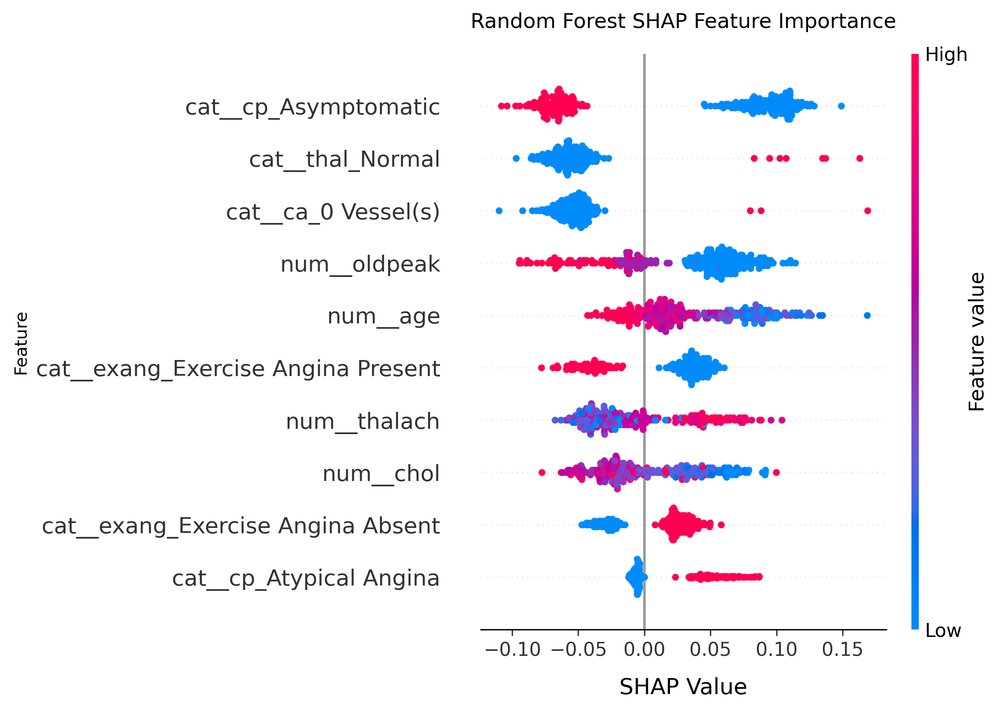

In [235]:
# initializing the shap explainer
explainer = shap.TreeExplainer(estimator)

# calculating the shap values
shap_values = explainer.shap_values(X_test)

# plotting a summary plot for the shap values
plot_shap_global_im_m(X_test, shap_values, feature_names, model_name, scorer)

#### SHAP Local

In [236]:
# printing the expected value of the explainer
print(f'Base Value: {explainer.expected_value[0]:.2}')

Base Value: 0.43


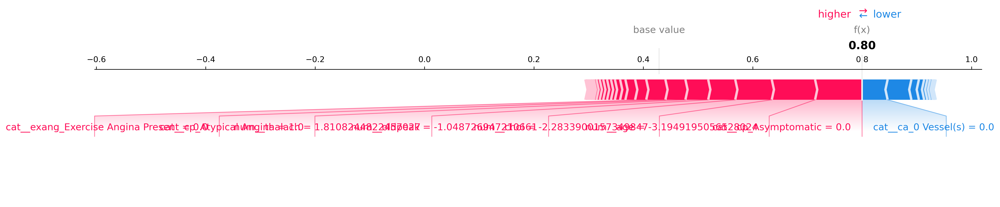

In [237]:
# initializing the index of the data point
index = 0

# plotting a force plot for the data point at the initialized index
shap.force_plot(explainer.expected_value[0], shap_values[0][index, :], features=X_test.iloc[index, :], feature_names=feature_names, 
                show=False, matplotlib=True).savefig(f'../figures/evaluation_figures/{model_name}/shap_{index}_{scorer}.png', bbox_inches='tight')

plt.show()

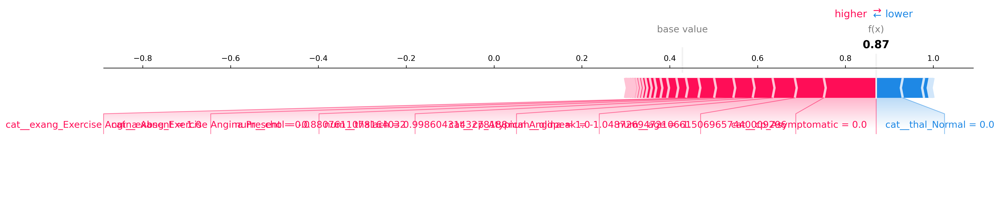

In [238]:
# initializing the index of the data point
index = 60

# plotting a force plot for the data point at the initialized index
shap.force_plot(explainer.expected_value[0], shap_values[0][index, :], features=X_test.iloc[index, :], feature_names=feature_names, 
                show=False, matplotlib=True).savefig(f'../figures/evaluation_figures/{model_name}/shap_{index}_{scorer}.png', bbox_inches='tight')

plt.show()

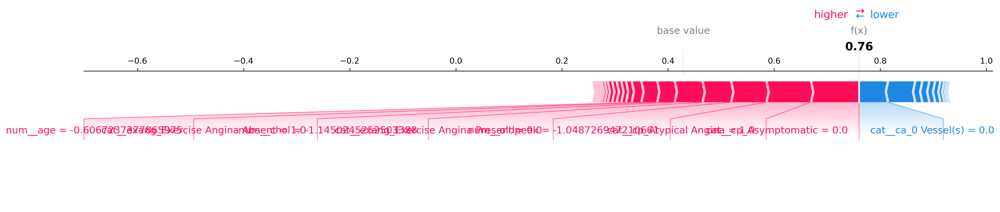

In [239]:
# initializing the index of the data point
index = 120

# plotting a force plot for the data point at the initialized index
shap.force_plot(explainer.expected_value[0], shap_values[0][index, :], features=X_test.iloc[index, :], feature_names=feature_names, 
                show=False, matplotlib=True).savefig(f'../figures/evaluation_figures/{model_name}/shap_{index}_{scorer}.png', bbox_inches='tight')

plt.show()

### F1 Score

In [240]:
# initializing the scorer
scorer = 'f'

In [241]:
# initializing the random forest results
with open('../results/random_forest/random_forest_f.pkl', 'rb') as f:
    rf_results_f = pickle.load(f)

# initializing the best random forest model
best_index = np.argmax(rf_results_f['test scores'])
best_model = rf_results_f['best models'][best_index]

processor = best_model.named_steps['columntransformer']
estimator = best_model.named_steps['randomforestclassifier']

In [242]:
print(processor)

ColumnTransformer(transformers=[('cat',
                                 Pipeline(steps=[('onehot',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False))]),
                                 ['sex', 'cp', 'fbs', 'restecg', 'exang',
                                  'slope', 'ca', 'thal', 'location']),
                                ('num',
                                 Pipeline(steps=[('imputer',
                                                  IterativeImputer(estimator=LinearRegression(),
                                                                   random_state=0)),
                                                 ('scaler', StandardScaler())]),
                                 ['age', 'trestbps', 'chol', 'thalach',
                                  'oldpeak'])])


In [243]:
print(estimator)

RandomForestClassifier(max_depth=30, max_features=0.25, random_state=0)


In [244]:
# initializing the overall test results of the random forest model
rf_test_results_f = overall_test_results(rf_results_f['best models'], rf_results_f['test sets'], 'randomforestclassifier')

y_true = rf_test_results_f['y true']
y_pred = rf_test_results_f['y pred']

In [245]:
# saving the overall test predictions of the random forest model
y_pred.to_csv(f'../results/{model_name}/{model_name}_prediction_{scorer}.csv', index=False)

#### Confusion Matrix

F1 Score: 0.77


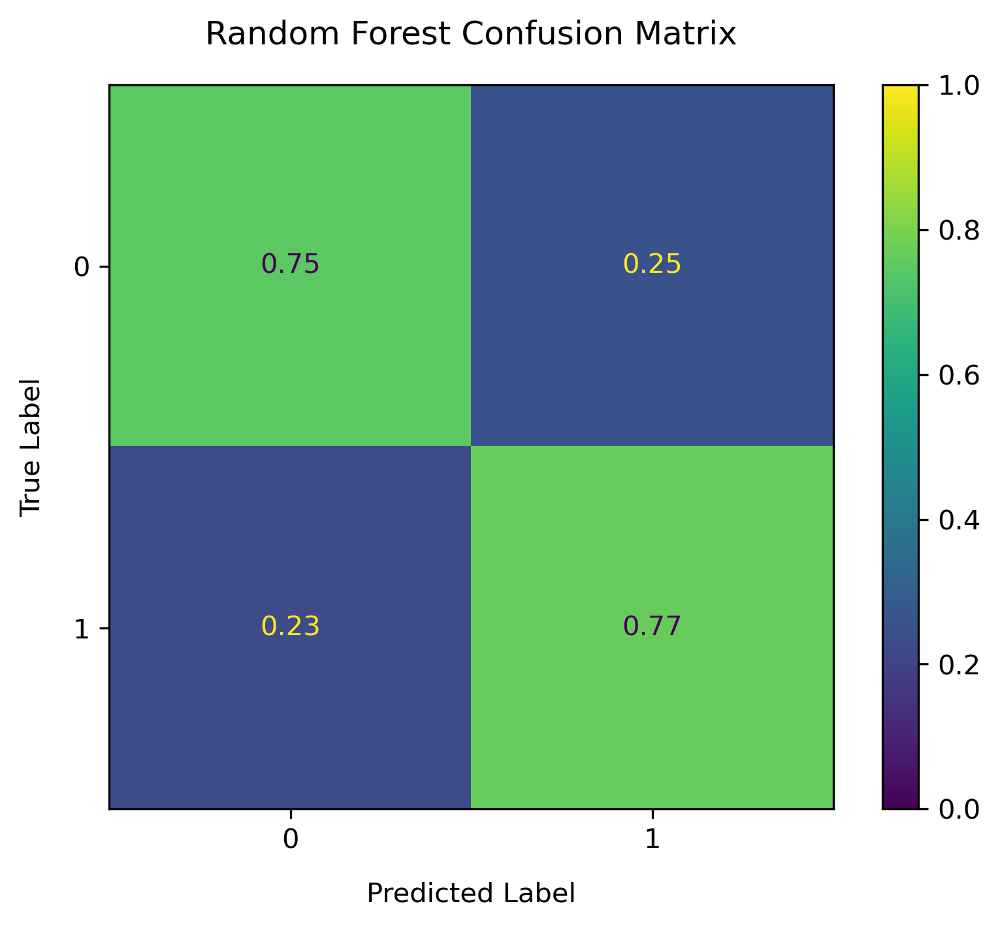

In [246]:
# printing the accuracy of the overall random forest prediction
print(f'F1 Score: {f1_score(y_true, y_pred):.2}')

# plotting the overall random forest prediction confusion matrix
plot_confusion(y_true, y_pred, [0, 1], model_name, scorer)

#### Test Set

In [247]:
# initializing the test feature matrix and target vector
X_test = processor.transform(rf_results_f['test sets'][best_index][0])
X_test = pd.DataFrame(data=X_test, columns=processor.get_feature_names_out())

y_test = rf_results_f['test sets'][best_index][1]

In [248]:
# initializing the feature names
feature_names = X_test.columns

#### Permutation

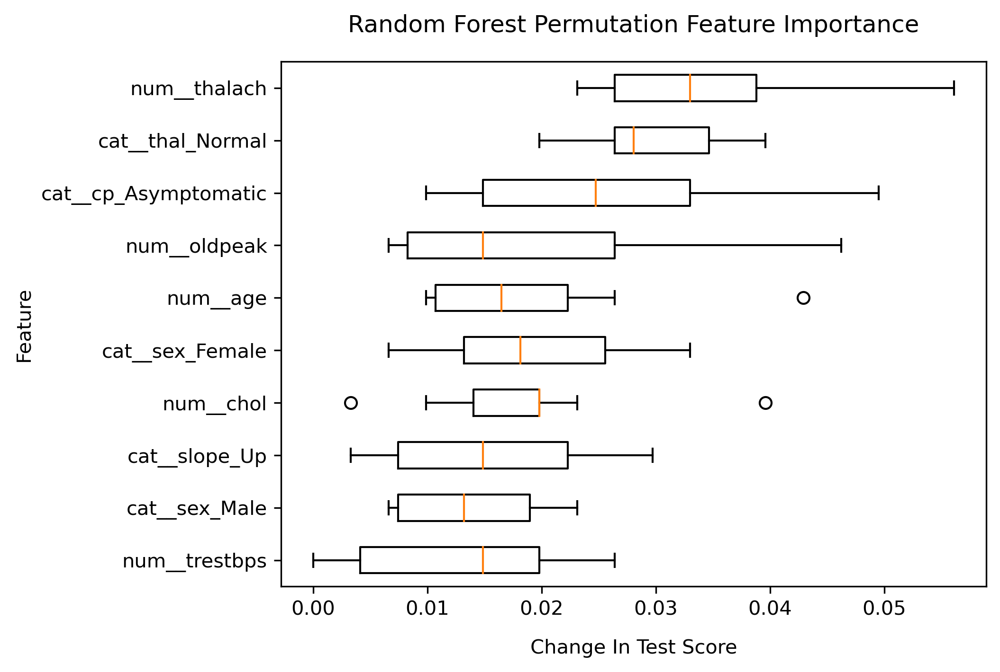

In [249]:
# plotting the top 10 most important features by feature importance
plot_permutation_im(estimator, X_test.to_numpy(), y_test.to_numpy(), model_name, scorer)

#### Node Impurity

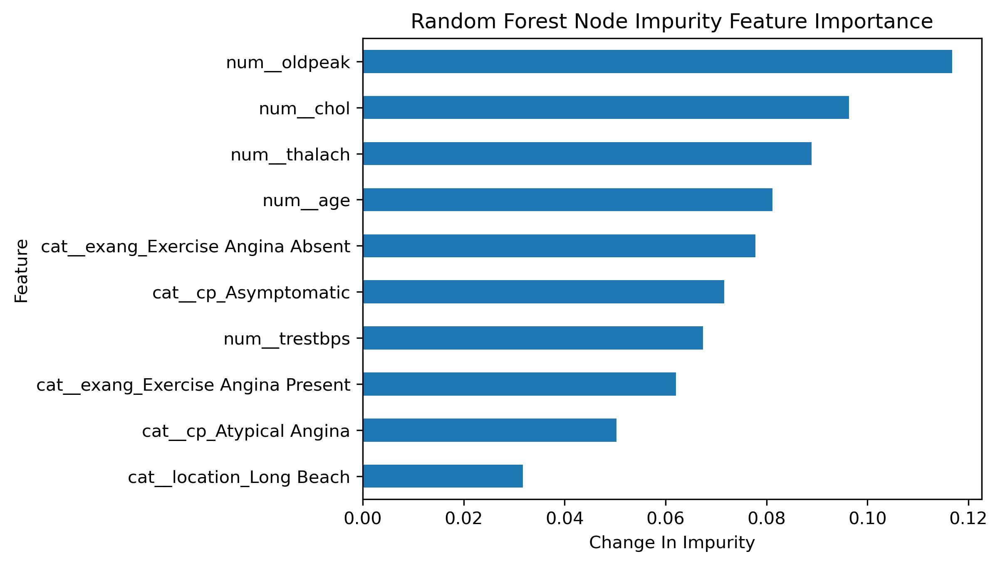

In [250]:
# plotting the top 10 most important features by node impurity
plot_feature_importances(estimator, feature_names, model_name, scorer)

#### SHAP Global

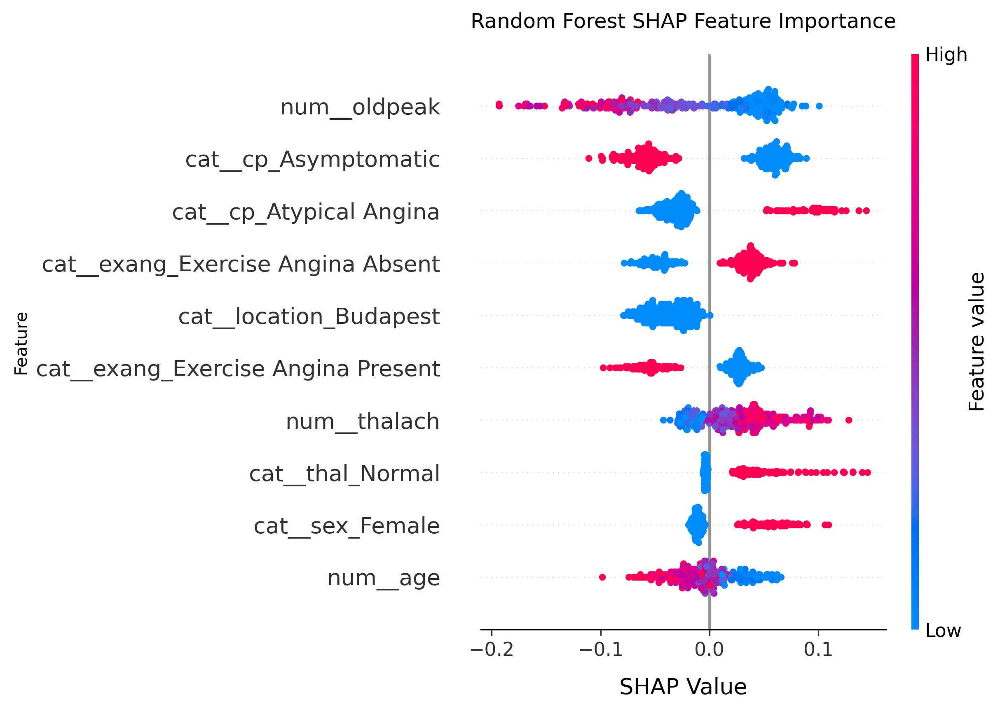

In [251]:
# initializing the shap explainer
explainer = shap.TreeExplainer(estimator)

# calculating the shap values
shap_values = explainer.shap_values(X_test)

# plotting a summary plot for the shap values
plot_shap_global_im_m(X_test, shap_values, feature_names, model_name, scorer)

#### SHAP Local

In [252]:
# printing the expected value of the explainer
print(f'Base Value: {explainer.expected_value[0]:.2}')

Base Value: 0.49


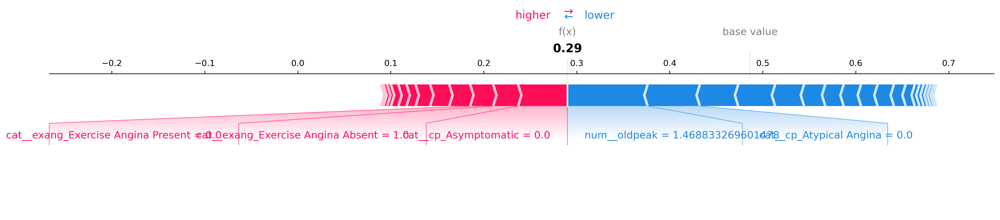

In [253]:
# initializing the index of the data point
index = 0

# plotting a force plot for the data point at the initialized index
shap.force_plot(explainer.expected_value[0], shap_values[0][index, :], features=X_test.iloc[index, :], feature_names=feature_names, 
                show=False, matplotlib=True).savefig(f'../figures/evaluation_figures/{model_name}/shap_{index}_{scorer}.png', bbox_inches='tight')

plt.show()

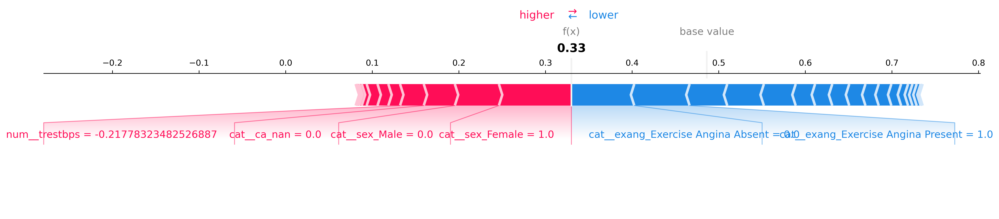

In [254]:
# initializing the index of the data point
index = 60

# plotting a force plot for the data point at the initialized index
shap.force_plot(explainer.expected_value[0], shap_values[0][index, :], features=X_test.iloc[index, :], feature_names=feature_names, 
                show=False, matplotlib=True).savefig(f'../figures/evaluation_figures/{model_name}/shap_{index}_{scorer}.png', bbox_inches='tight')

plt.show()

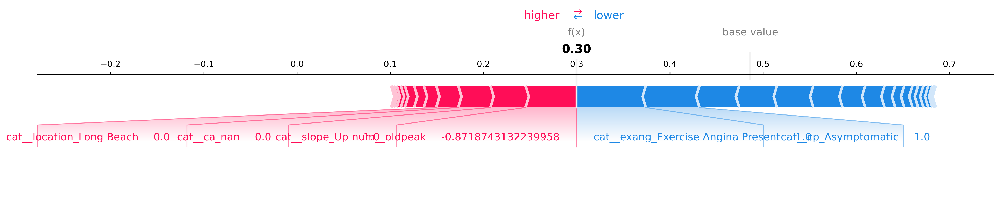

In [255]:
# initializing the index of the data point
index = 120

# plotting a force plot for the data point at the initialized index
shap.force_plot(explainer.expected_value[0], shap_values[0][index, :], features=X_test.iloc[index, :], feature_names=feature_names, 
                show=False, matplotlib=True).savefig(f'../figures/evaluation_figures/{model_name}/shap_{index}_{scorer}.png', bbox_inches='tight')

plt.show()

## KNN

In [256]:
# initializing the model name
model_name = 'k_nearest_neighbors'

### Accuracy Score

In [257]:
# initializing the scorer
scorer = 'a'

In [258]:
# initializing the k nearest neighbors results
with open('../results/k_nearest_neighbors/k_nearest_neighbors_a.pkl', 'rb') as f:
    knc_results_a = pickle.load(f)

# initializing the best k nearest neighbors model
best_index = np.argmax(knc_results_a['test scores'])
best_model = knc_results_a['best models'][best_index]

processor = best_model.named_steps['columntransformer']
estimator = best_model.named_steps['kneighborsclassifier']

In [259]:
print(processor)

ColumnTransformer(transformers=[('cat',
                                 Pipeline(steps=[('onehot',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False))]),
                                 ['sex', 'cp', 'fbs', 'restecg', 'exang',
                                  'slope', 'ca', 'thal', 'location']),
                                ('num',
                                 Pipeline(steps=[('imputer',
                                                  IterativeImputer(estimator=LinearRegression(),
                                                                   random_state=0)),
                                                 ('scaler', StandardScaler())]),
                                 ['age', 'trestbps', 'chol', 'thalach',
                                  'oldpeak'])])


In [260]:
print(estimator)

KNeighborsClassifier(n_neighbors=11)


In [261]:
# initializing the overall test results of the k nearest neighbors model
knc_test_results_a = overall_test_results(knc_results_a['best models'], knc_results_a['test sets'], 'kneighborsclassifier')

y_true = knc_test_results_a['y true']
y_pred = knc_test_results_a['y pred']

In [262]:
# saving the overall test predictions of the k nearest neighbors model
y_pred.to_csv(f'../results/{model_name}/{model_name}_prediction_{scorer}.csv', index=False)

#### Confusion Matrix

Accuracy Score: 0.7


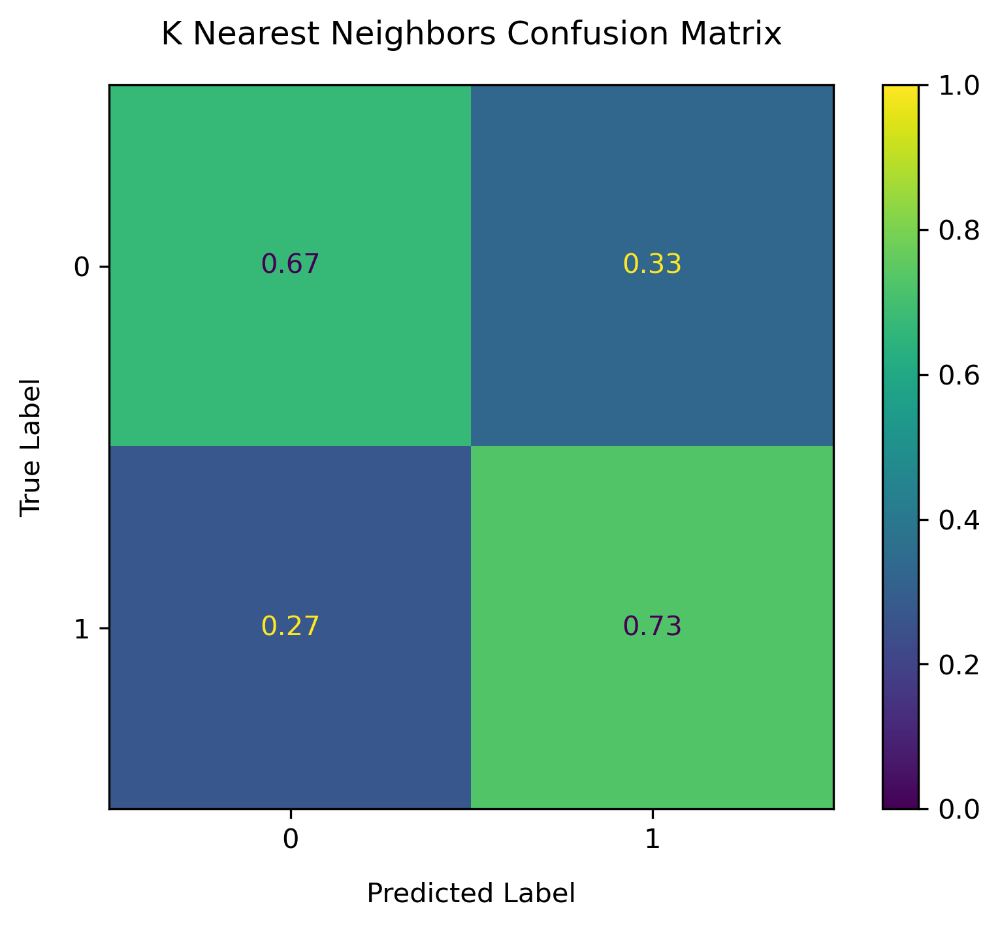

In [263]:
# printing the accuracy of the overall k nearest neighbors prediction
print(f'Accuracy Score: {accuracy_score(y_true, y_pred):.2}')

# plotting the overall k nearest neighbors prediction confusion matrix
plot_confusion(y_true, y_pred, [0, 1], model_name, scorer)

#### Test Set

In [264]:
# initializing the test feature matrix and target vector
X_test = processor.transform(knc_results_a['test sets'][best_index][0])
X_test = pd.DataFrame(data=X_test, columns=processor.get_feature_names_out())

y_test = knc_results_a['test sets'][best_index][1]

In [265]:
# initializing the feature names
feature_names = X_test.columns

#### Permutation

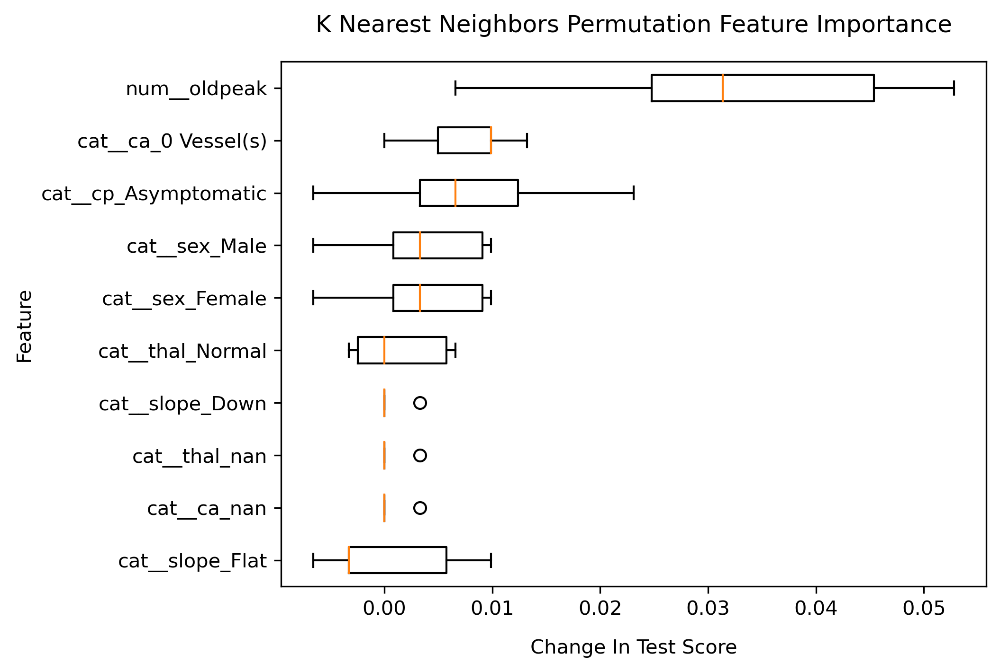

In [266]:
# plotting the top 10 most important features by feature importance
plot_permutation_im(estimator, X_test.to_numpy(), y_test.to_numpy(), model_name, scorer)

#### SHAP Global

  0%|          | 0/303 [00:00<?, ?it/s]

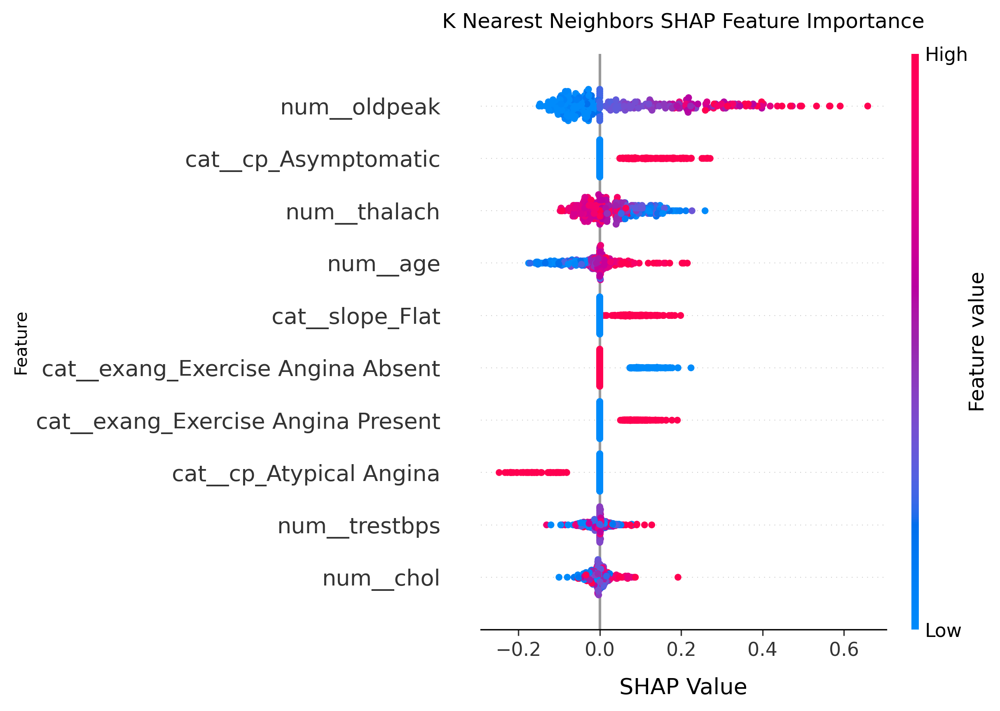

In [267]:
# initializing the shap explainer
fun = lambda x: estimator.predict_proba(x)[:, 1]
med = X_test.median().values.reshape((1, X_test.shape[1]))

explainer = shap.KernelExplainer(fun, med)

# calculating the shap values
shap_values = explainer.shap_values(X_test)

# plotting a summary plot for the shap values
plot_shap_global_im_s(X_test, shap_values, feature_names, model_name, scorer)

#### SHAP Local

In [268]:
# printing the expected value of the explainer
print(f'Base Value: {explainer.expected_value:.2}')

Base Value: 0.27


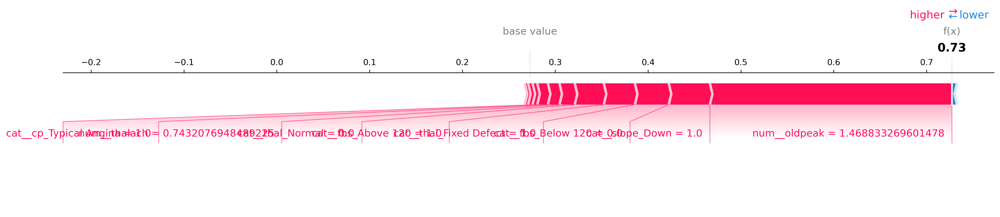

In [269]:
# initializing the index of the data point
index = 0

# plotting a force plot for the data point at the initialized index
shap.force_plot(explainer.expected_value, shap_values[index, :], features=X_test.iloc[index, :], feature_names=feature_names, 
                show=False, matplotlib=True).savefig(f'../figures/evaluation_figures/{model_name}/shap_{index}_{scorer}.png', bbox_inches='tight')

plt.show()

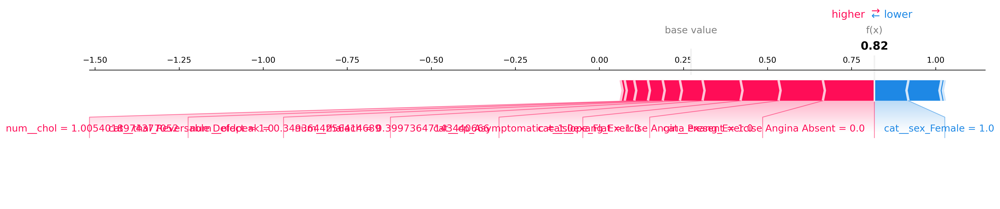

In [270]:
# initializing the index of the data point
index = 60

# plotting a force plot for the data point at the initialized index
shap.force_plot(explainer.expected_value, shap_values[index, :], features=X_test.iloc[index, :], feature_names=feature_names, 
                show=False, matplotlib=True).savefig(f'../figures/evaluation_figures/{model_name}/shap_{index}_{scorer}.png', bbox_inches='tight')

plt.show()

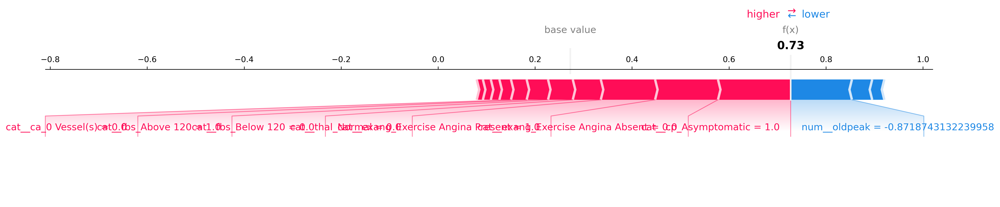

In [271]:
# initializing the index of the data point
index = 120

# plotting a force plot for the data point at the initialized index
shap.force_plot(explainer.expected_value, shap_values[index, :], features=X_test.iloc[index, :], feature_names=feature_names, 
                show=False, matplotlib=True).savefig(f'../figures/evaluation_figures/{model_name}/shap_{index}_{scorer}.png', bbox_inches='tight')

plt.show()

### F1 Score

In [272]:
# initializing the scorer
scorer = 'f'

In [273]:
# initializing the k nearest neighbors results
with open('../results/k_nearest_neighbors/k_nearest_neighbors_f.pkl', 'rb') as f:
    knc_results_f = pickle.load(f)

# initializing the best k nearest neighbros model
best_index = np.argmax(knc_results_f['test scores'])
best_model = knc_results_f['best models'][best_index]

processor = best_model.named_steps['columntransformer']
estimator = best_model.named_steps['kneighborsclassifier']

In [274]:
print(processor)

ColumnTransformer(transformers=[('cat',
                                 Pipeline(steps=[('onehot',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False))]),
                                 ['sex', 'cp', 'fbs', 'restecg', 'exang',
                                  'slope', 'ca', 'thal', 'location']),
                                ('num',
                                 Pipeline(steps=[('imputer',
                                                  IterativeImputer(estimator=LinearRegression(),
                                                                   random_state=0)),
                                                 ('scaler', StandardScaler())]),
                                 ['age', 'trestbps', 'chol', 'thalach',
                                  'oldpeak'])])


In [275]:
print(estimator)

KNeighborsClassifier(n_neighbors=31)


In [276]:
# initializing the overall test results of the k nearest neighbors model
knc_test_results_f = overall_test_results(knc_results_f['best models'], knc_results_f['test sets'], 'kneighborsclassifier')

y_true = knc_test_results_f['y true']
y_pred = knc_test_results_f['y pred']

In [277]:
# saving the overall test predictions of the k nearest neighbors model
y_pred.to_csv(f'../results/{model_name}/{model_name}_prediction_{scorer}.csv', index=False)

#### Confusion Matrix

F1 Score: 0.74


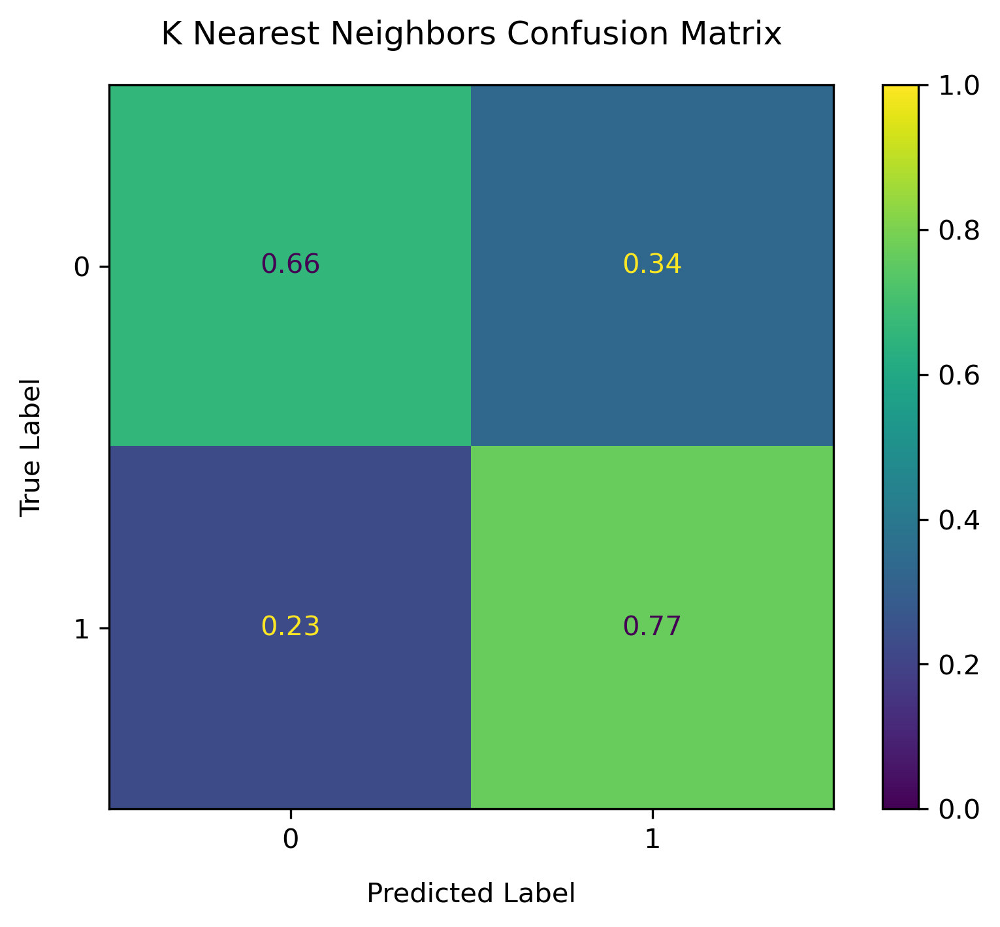

In [278]:
# printing the accuracy of the overall k nearest neighbors prediction
print(f'F1 Score: {f1_score(y_true, y_pred):.2}')

# plotting the overall k nearest neighbors prediction confusion matrix
plot_confusion(y_true, y_pred, [0, 1], model_name, scorer)

#### Test Set

In [279]:
# initializing the test feature matrix and target vector
X_test = processor.transform(knc_results_f['test sets'][best_index][0])
X_test = pd.DataFrame(data=X_test, columns=processor.get_feature_names_out())

y_test = knc_results_f['test sets'][best_index][1]

In [280]:
# initializing the feature names
feature_names = X_test.columns

#### Permutation

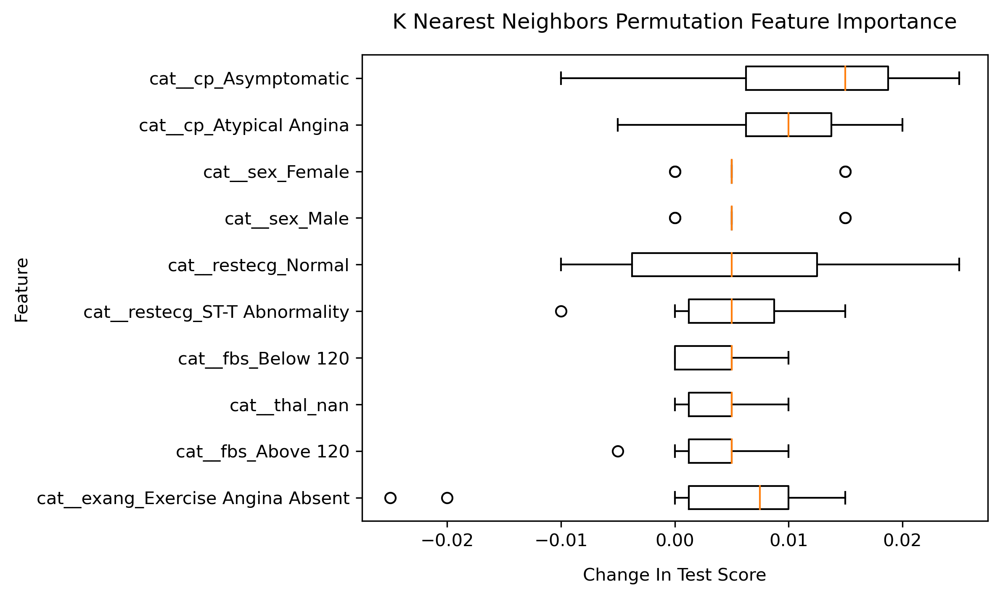

In [281]:
# plotting the top 10 most important features by feature importance
plot_permutation_im(estimator, X_test.to_numpy(), y_test.to_numpy(), model_name, scorer)

#### SHAP Global

  0%|          | 0/200 [00:00<?, ?it/s]

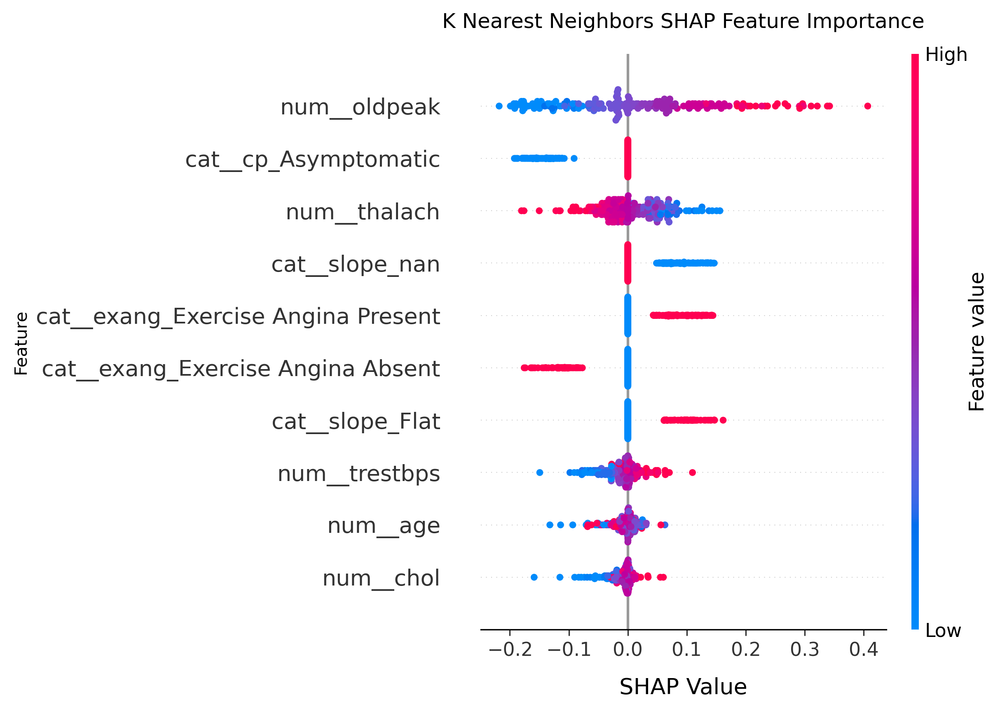

In [282]:
# initializing the shap explainer
fun = lambda x: estimator.predict_proba(x)[:, 1]
med = X_test.median().values.reshape((1, X_test.shape[1]))

explainer = shap.KernelExplainer(fun, med)

# calculating the shap values
shap_values = explainer.shap_values(X_test)

# plotting a summary plot for the shap values
plot_shap_global_im_s(X_test, shap_values, feature_names, model_name, scorer)

#### SHAP Local

In [283]:
# printing the expected value of the explainer
print(f'Base Value: {explainer.expected_value:.2}')

Base Value: 0.58


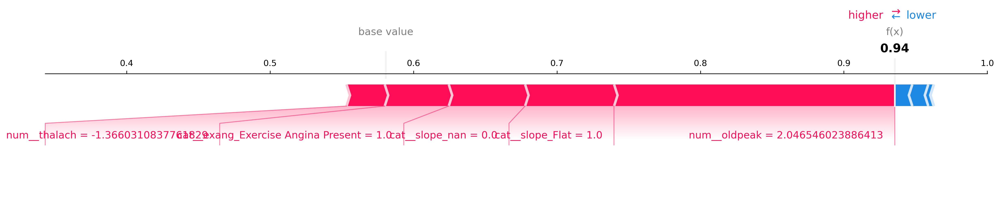

In [284]:
# initializing the index of the data point
index = 0

# plotting a force plot for the data point at the initialized index
shap.force_plot(explainer.expected_value, shap_values[index, :], features=X_test.iloc[index, :], feature_names=feature_names, 
                show=False, matplotlib=True).savefig(f'../figures/evaluation_figures/{model_name}/shap_{index}_{scorer}.png', bbox_inches='tight')

plt.show()

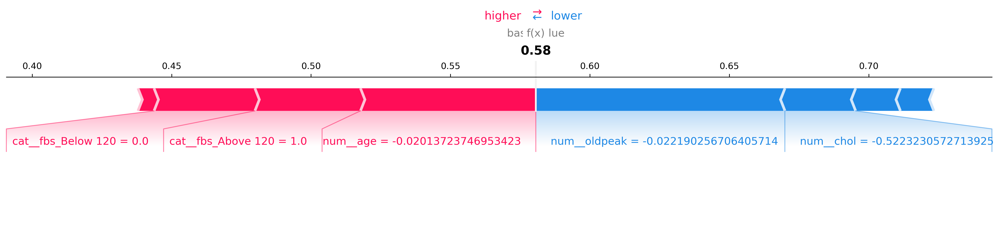

In [285]:
# initializing the index of the data point
index = 60

# plotting a force plot for the data point at the initialized index
shap.force_plot(explainer.expected_value, shap_values[index, :], features=X_test.iloc[index, :], feature_names=feature_names, 
                show=False, matplotlib=True).savefig(f'../figures/evaluation_figures/{model_name}/shap_{index}_{scorer}.png', bbox_inches='tight')

plt.show()

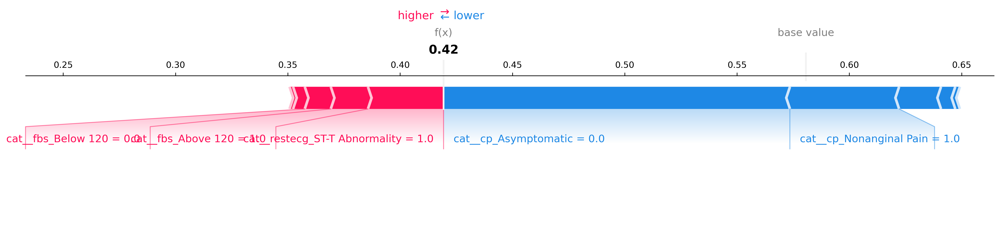

In [286]:
# initializing the index of the data point
index = 120

# plotting a force plot for the data point at the initialized index
shap.force_plot(explainer.expected_value, shap_values[index, :], features=X_test.iloc[index, :], feature_names=feature_names, 
                show=False, matplotlib=True).savefig(f'../figures/evaluation_figures/{model_name}/shap_{index}_{scorer}.png', bbox_inches='tight')

plt.show()

## SVM

In [287]:
# initializing the model name
model_name = 'support_vector_machine'

### Accuracy Score

In [288]:
# initializing the scorer
scorer = 'a'

In [289]:
# initializing the support vector machine results
with open('../results/support_vector_machine/support_vector_machine_a.pkl', 'rb') as f:
    svc_results_a = pickle.load(f)

# initializing the best support vector machine model
best_index = np.argmax(svc_results_a['test scores'])
best_model = svc_results_a['best models'][best_index]

processor = best_model.named_steps['columntransformer']
estimator = best_model.named_steps['svc']

In [290]:
print(processor)

ColumnTransformer(transformers=[('cat',
                                 Pipeline(steps=[('onehot',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False)),
                                                 ('scaler1',
                                                  StandardScaler())]),
                                 ['sex', 'cp', 'fbs', 'restecg', 'exang',
                                  'slope', 'ca', 'thal', 'location']),
                                ('num',
                                 Pipeline(steps=[('imputer',
                                                  IterativeImputer(estimator=LinearRegression(),
                                                                   random_state=0)),
                                                 ('scaler2',
                                                  StandardScaler())]),
                                

In [291]:
print(estimator)

SVC(C=5.994842503189409, gamma=0.1, kernel='linear', probability=True,
    random_state=0)


In [292]:
# initializing the overall test results of the support vector machine model
svc_test_results_a = overall_test_results(svc_results_a['best models'], svc_results_a['test sets'], 'svc')

y_true = svc_test_results_a['y true']
y_pred = svc_test_results_a['y pred']

In [293]:
# saving the overall test predictions of the support vector machine model
y_pred.to_csv(f'../results/{model_name}/{model_name}_prediction_{scorer}.csv', index=False)

#### Confusion Matrix

Accuracy Score: 0.76


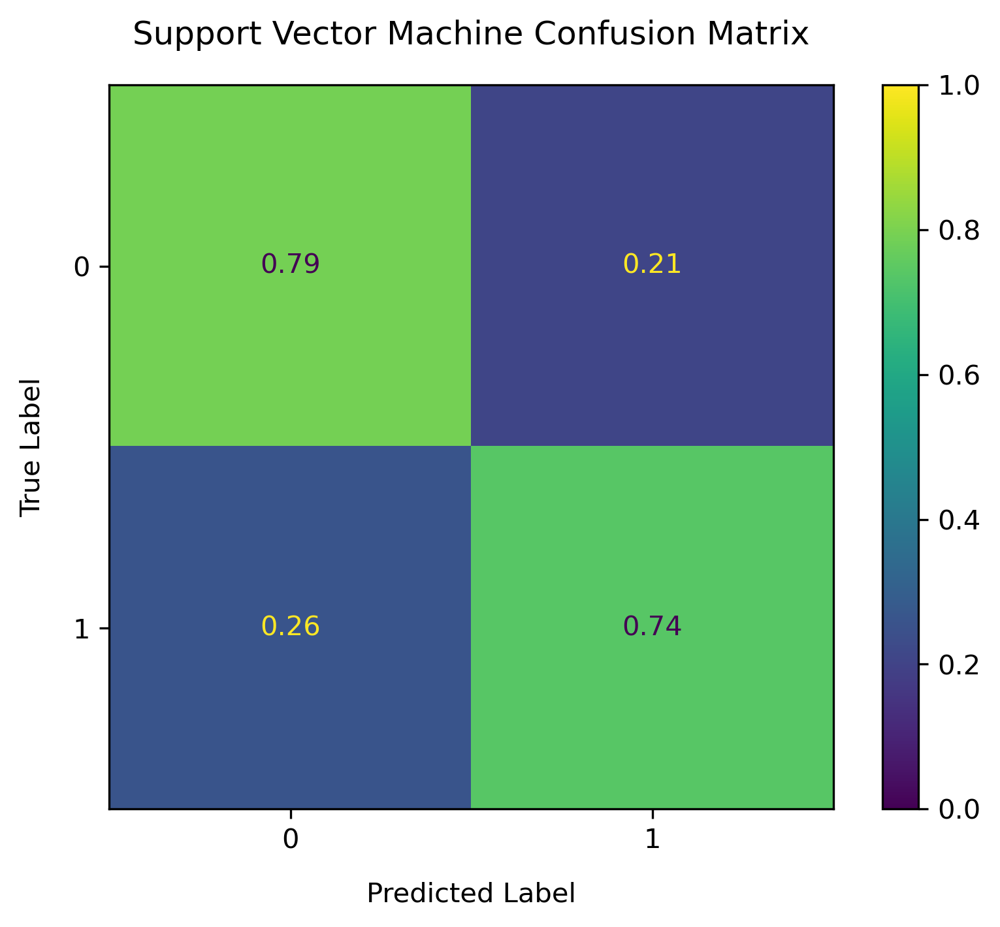

In [294]:
# printing the accuracy of the overall support vector machine prediction
print(f'Accuracy Score: {accuracy_score(y_true, y_pred):.2}')

# plotting the overall support vector machine prediction confusion matrix
plot_confusion(y_true, y_pred, [0, 1], model_name, scorer)

#### Test Set

In [295]:
# initializing the test feature matrix and target vector
X_test = processor.transform(svc_results_a['test sets'][best_index][0])
X_test = pd.DataFrame(data=X_test, columns=processor.get_feature_names_out())

y_test = svc_results_a['test sets'][best_index][1]

In [296]:
# initializing the feature names
feature_names = X_test.columns

#### Permutation

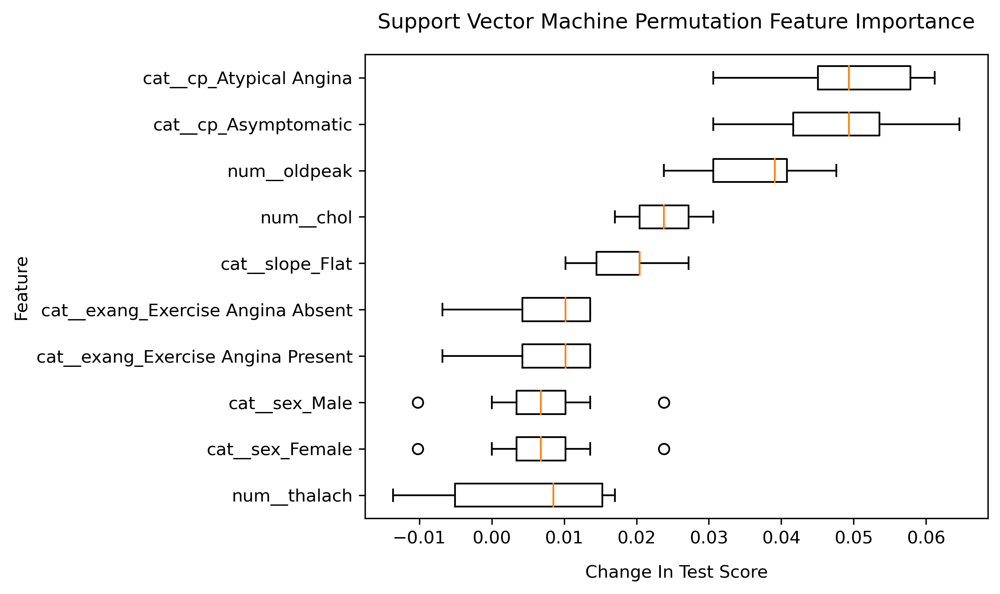

In [297]:
# plotting the top 10 most important features by feature importance
plot_permutation_im(estimator, X_test.to_numpy(), y_test.to_numpy(), model_name, scorer)

#### Coefficient

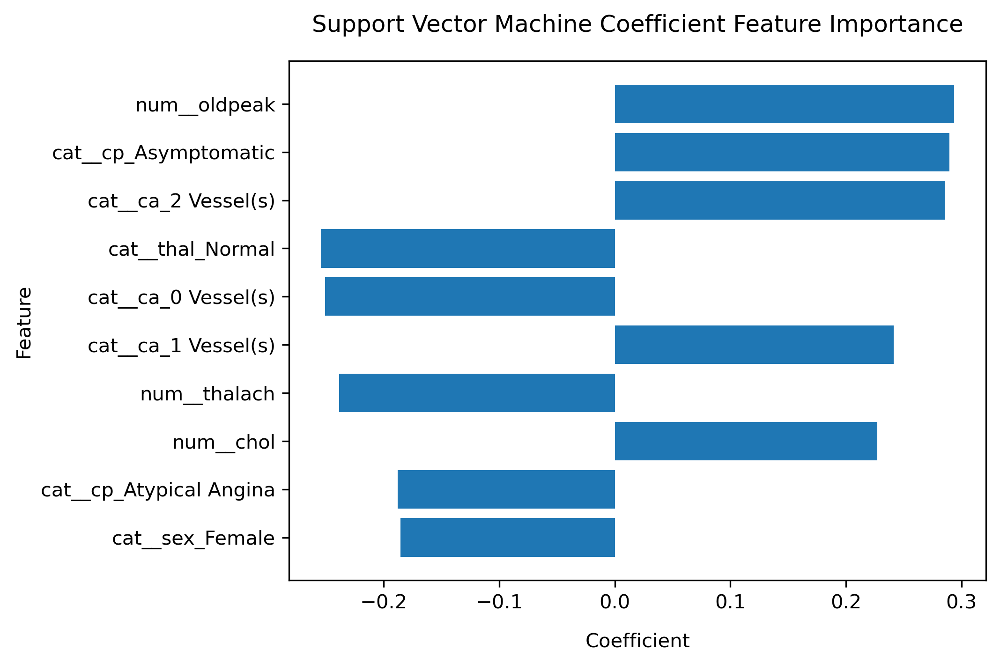

In [298]:
# plotting the top 10 most important features by coefficient
plot_coefficient_im(estimator, feature_names, model_name, scorer)

#### SHAP Global

  0%|          | 0/294 [00:00<?, ?it/s]

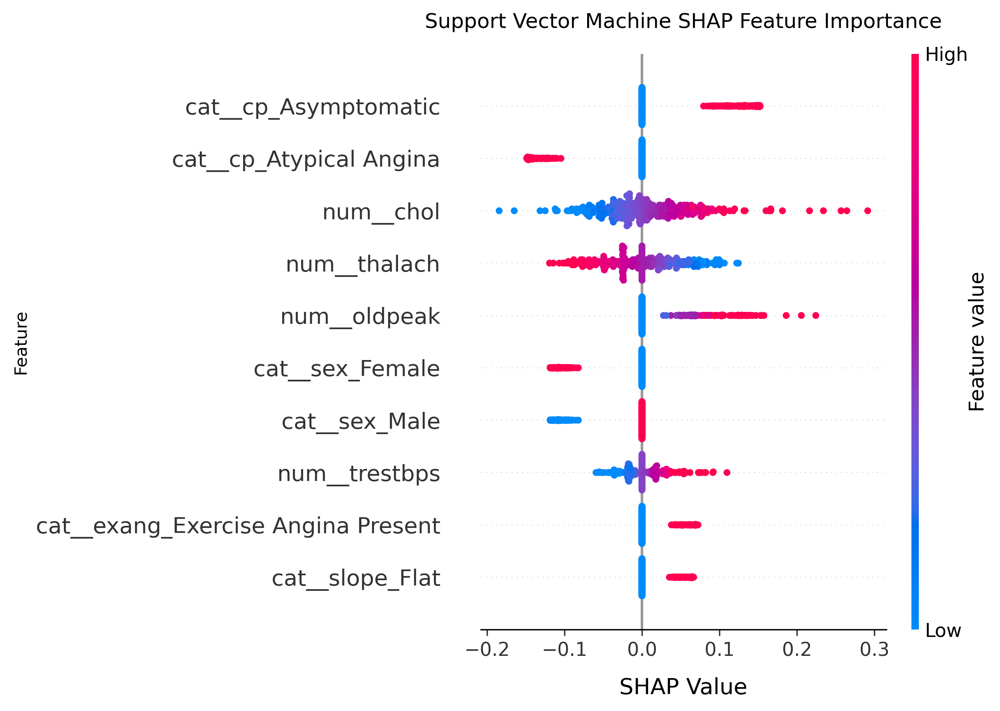

In [299]:
# initializing the shap explainer
fun = lambda x: estimator.predict_proba(x)[:, 1]
med = X_test.median().values.reshape((1, X_test.shape[1]))

explainer = shap.KernelExplainer(fun, med)

# calculating the shap values
shap_values = explainer.shap_values(X_test)

# plotting a summary plot for the shap values
plot_shap_global_im_s(X_test, shap_values, feature_names, model_name, scorer)

#### SHAP Local

In [300]:
# printing the expected value of the explainer
print(f'Base Value: {explainer.expected_value:.2}')

Base Value: 0.52


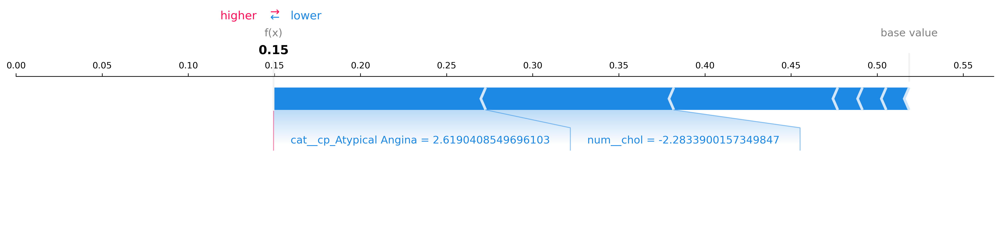

In [301]:
# initializing the index of the data point
index = 0

# plotting a force plot for the data point at the initialized index
shap.force_plot(explainer.expected_value, shap_values[index, :], features=X_test.iloc[index, :], feature_names=feature_names, 
                show=False, matplotlib=True).savefig(f'../figures/evaluation_figures/{model_name}/shap_{index}_{scorer}.png', bbox_inches='tight')

plt.show()

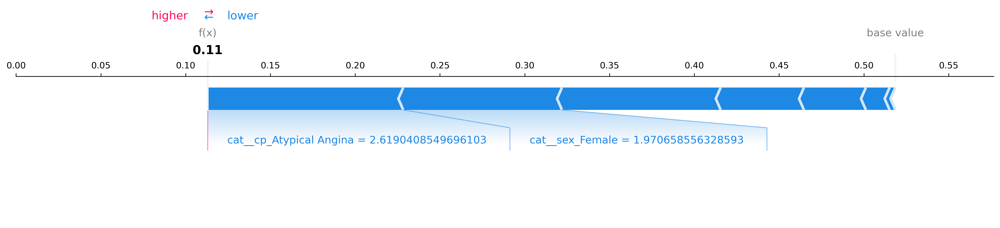

In [302]:
# initializing the index of the data point
index = 60

# plotting a force plot for the data point at the initialized index
shap.force_plot(explainer.expected_value, shap_values[index, :], features=X_test.iloc[index, :], feature_names=feature_names, 
                show=False, matplotlib=True).savefig(f'../figures/evaluation_figures/{model_name}/shap_{index}_{scorer}.png', bbox_inches='tight')

plt.show()

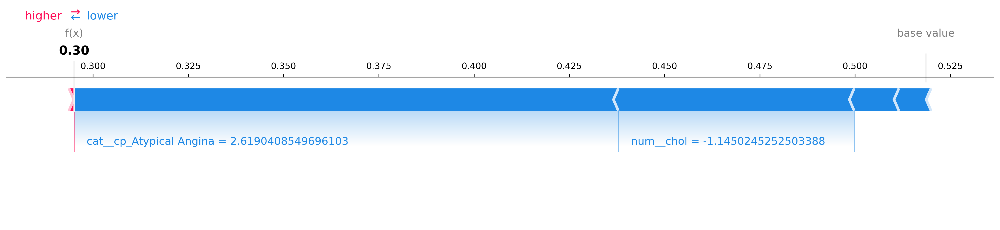

In [303]:
# initializing the index of the data point
index = 120

# plotting a force plot for the data point at the initialized index
shap.force_plot(explainer.expected_value, shap_values[index, :], features=X_test.iloc[index, :], feature_names=feature_names, 
                show=False, matplotlib=True).savefig(f'../figures/evaluation_figures/{model_name}/shap_{index}_{scorer}.png', bbox_inches='tight')

plt.show()

### F1 Score

In [304]:
# initializing the scorer
scorer = 'f'

In [305]:
# initializing the support vector machine results
with open('../results/support_vector_machine/support_vector_machine_f.pkl', 'rb') as f:
    svc_results_f = pickle.load(f)

# initializing the best support vector machine model
best_index = np.argmax(svc_results_f['test scores'])
best_model = svc_results_f['best models'][best_index]

processor = best_model.named_steps['columntransformer']
estimator = best_model.named_steps['svc']

In [306]:
print(processor)

ColumnTransformer(transformers=[('cat',
                                 Pipeline(steps=[('onehot',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False)),
                                                 ('scaler1',
                                                  StandardScaler())]),
                                 ['sex', 'cp', 'fbs', 'restecg', 'exang',
                                  'slope', 'ca', 'thal', 'location']),
                                ('num',
                                 Pipeline(steps=[('imputer',
                                                  IterativeImputer(estimator=LinearRegression(),
                                                                   random_state=0)),
                                                 ('scaler2',
                                                  StandardScaler())]),
                                

In [307]:
print(estimator)

SVC(C=0.1, gamma=0.1, kernel='linear', probability=True, random_state=0)


In [308]:
# initializing the overall test results of the support vector machine model
svc_test_results_f = overall_test_results(svc_results_f['best models'], svc_results_f['test sets'], 'svc')

y_true = svc_test_results_f['y true']
y_pred = svc_test_results_f['y pred']

In [309]:
# saving the overall test predictions of the support vector machine model
y_pred.to_csv(f'../results/{model_name}/{model_name}_prediction_{scorer}.csv', index=False)

#### Confusion Matrix

F1 Score: 0.77


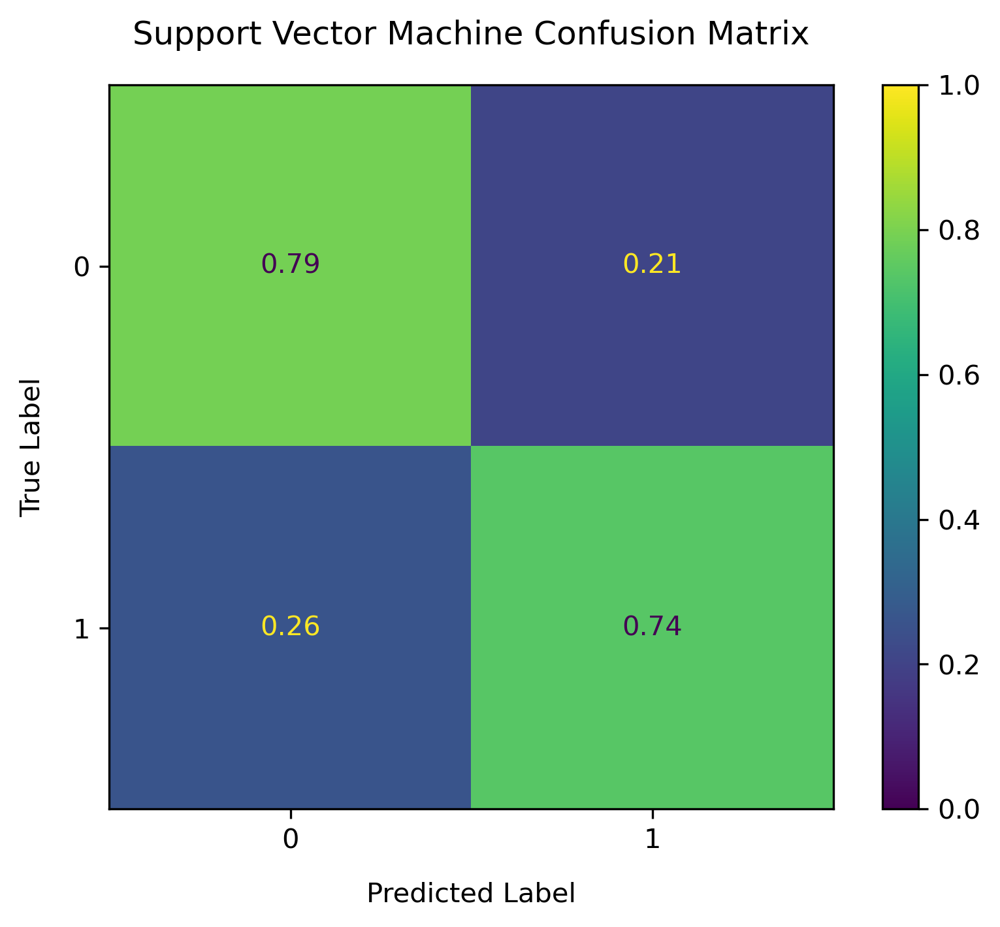

In [310]:
# printing the accuracy of the overall support vector machine prediction
print(f'F1 Score: {f1_score(y_true, y_pred):.2}')

# plotting the overall support vector machine prediction confusion matrix
plot_confusion(y_true, y_pred, [0, 1], model_name, scorer)

#### Test Set

In [311]:
# initializing the test feature matrix and target vector
X_test = processor.transform(svc_results_f['test sets'][best_index][0])
X_test = pd.DataFrame(data=X_test, columns=processor.get_feature_names_out())

y_test = svc_results_f['test sets'][best_index][1]

In [312]:
# initializing the feature names
feature_names = X_test.columns

#### Permutation

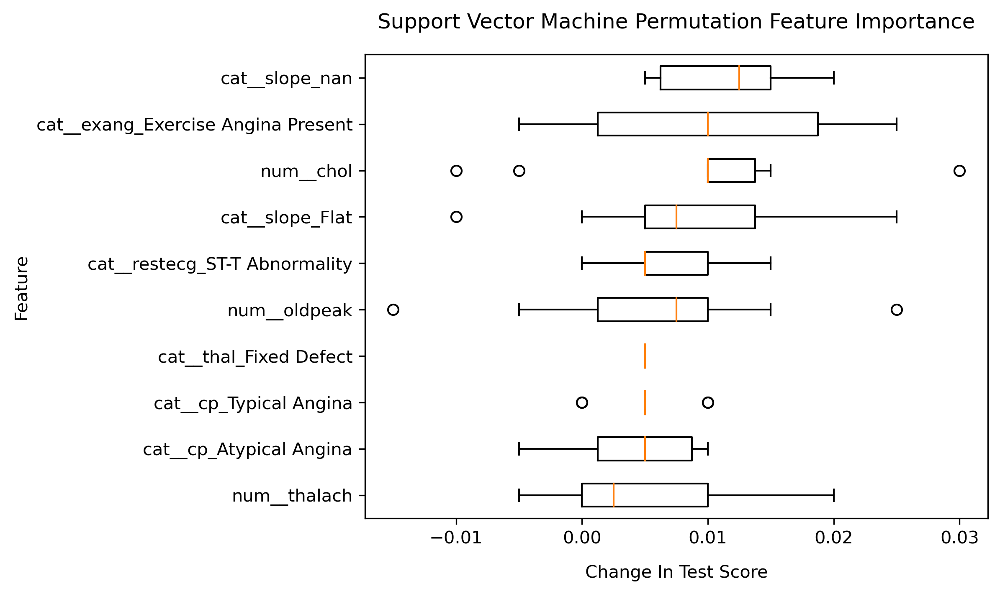

In [313]:
# plotting the top 10 most important features by feature importance
plot_permutation_im(estimator, X_test.to_numpy(), y_test.to_numpy(), model_name, scorer)

#### Coefficient

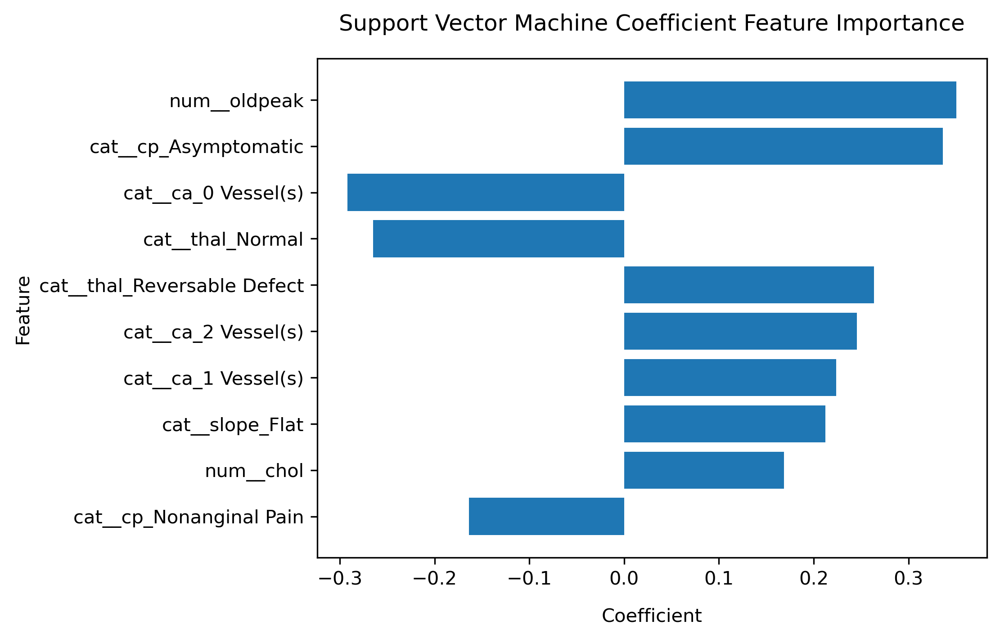

In [314]:
# plotting the top 10 most important features by coefficient
plot_coefficient_im(estimator, feature_names, model_name, scorer)

#### SHAP Global

  0%|          | 0/200 [00:00<?, ?it/s]

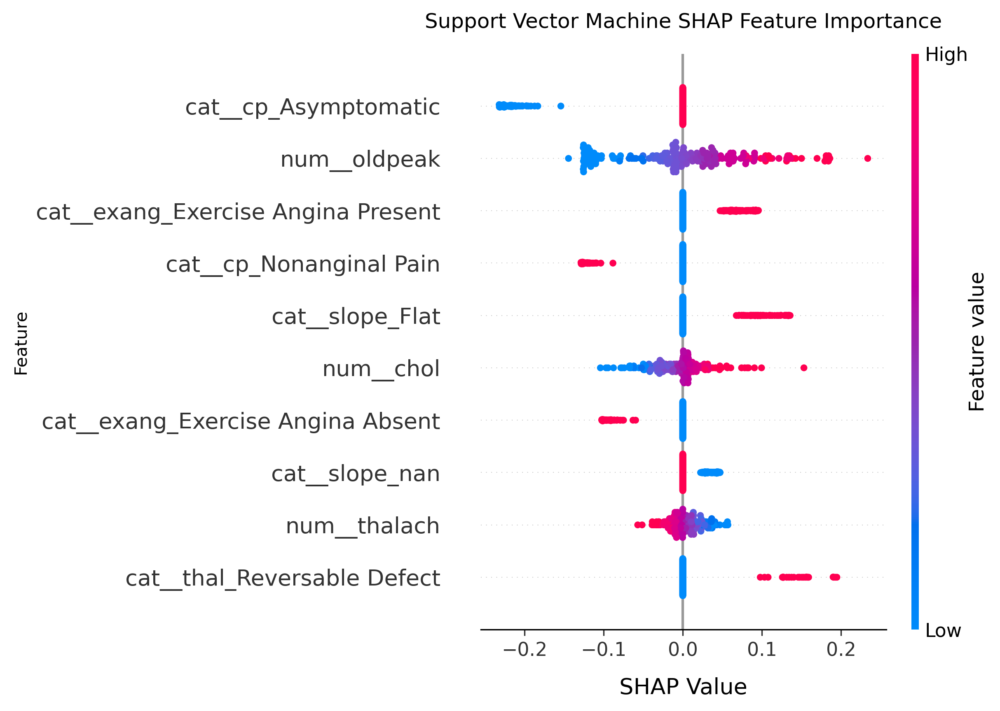

In [315]:
# initializing the shap explainer
fun = lambda x: estimator.predict_proba(x)[:, 1]
med = X_test.median().values.reshape((1, X_test.shape[1]))

explainer = shap.KernelExplainer(fun, med)

# calculating the shap values
shap_values = explainer.shap_values(X_test)

# plotting a summary plot for the shap values
plot_shap_global_im_s(X_test, shap_values, feature_names, model_name, scorer)

#### SHAP Local

In [316]:
# printing the expected value of the explainer
print(f'Base Value: {explainer.expected_value:.2}')

Base Value: 0.7


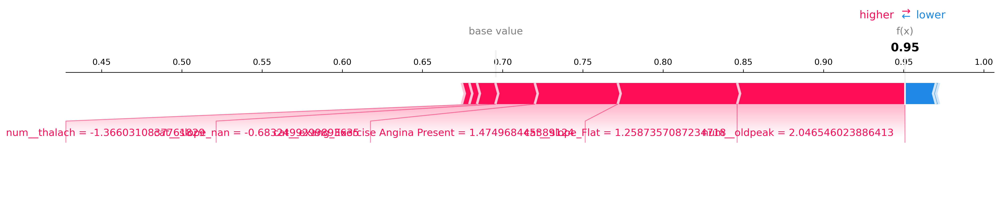

In [317]:
# initializing the index of the data point
index = 0

# plotting a force plot for the data point at the initialized index
shap.force_plot(explainer.expected_value, shap_values[index, :], features=X_test.iloc[index, :], feature_names=feature_names, 
                show=False, matplotlib=True).savefig(f'../figures/evaluation_figures/{model_name}/shap_{index}_{scorer}.png', bbox_inches='tight')

plt.show()

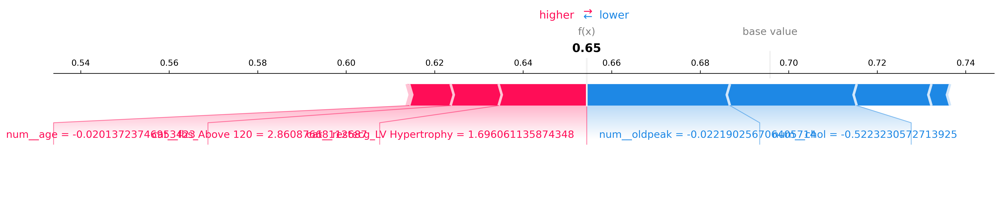

In [318]:
# initializing the index of the data point
index = 60

# plotting a force plot for the data point at the initialized index
shap.force_plot(explainer.expected_value, shap_values[index, :], features=X_test.iloc[index, :], feature_names=feature_names, 
                show=False, matplotlib=True).savefig(f'../figures/evaluation_figures/{model_name}/shap_{index}_{scorer}.png', bbox_inches='tight')

plt.show()

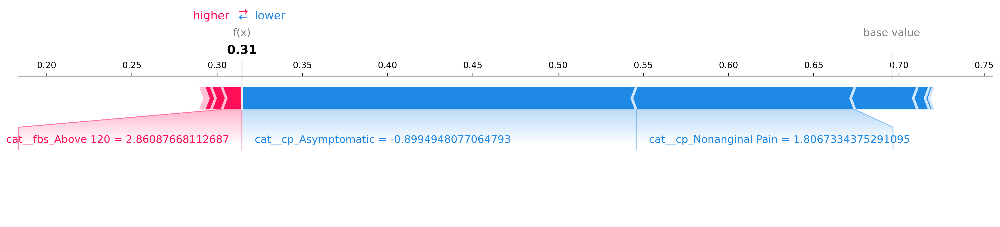

In [319]:
# initializing the index of the data point
index = 120

# plotting a force plot for the data point at the initialized index
shap.force_plot(explainer.expected_value, shap_values[index, :], features=X_test.iloc[index, :], feature_names=feature_names, 
                show=False, matplotlib=True).savefig(f'../figures/evaluation_figures/{model_name}/shap_{index}_{scorer}.png', bbox_inches='tight')

plt.show()

## XGBoost

In [320]:
# initializing the model name
model_name = 'extreme_gradient_boosting'

### Accuracy Score

In [321]:
# initializing the scorer
scorer = 'a'

In [322]:
# initializing the extreme gradient boosting results
with open('../results/extreme_gradient_boosting/extreme_gradient_boosting_a.pkl', 'rb') as f:
    xgb_results_a = pickle.load(f)

# initializing the best extreme gradient boosting model
best_index = np.argmax(xgb_results_a['test scores'])
best_model = xgb_results_a['best models'][best_index]

processor = best_model.named_steps['columntransformer']
estimator = best_model.named_steps['xgbclassifier']

In [323]:
print(processor)

ColumnTransformer(transformers=[('cat',
                                 Pipeline(steps=[('onehot',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False))]),
                                 ['sex', 'cp', 'fbs', 'restecg', 'exang',
                                  'slope', 'ca', 'thal', 'location']),
                                ('num',
                                 Pipeline(steps=[('scaler', StandardScaler())]),
                                 ['age', 'trestbps', 'chol', 'thalach',
                                  'oldpeak'])])


In [324]:
print(estimator)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.9, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.03, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=1, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=500, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=0, ...)


In [325]:
# initializing the overall test results of the extreme gradient boosting model
xgb_test_results_a = overall_test_results(xgb_results_a['best models'], xgb_results_a['test sets'], 'xgbclassifier')

y_true = xgb_test_results_a['y true']
y_pred = xgb_test_results_a['y pred']

In [326]:
# saving the overall test predictions of the extreme gradient boosting model
y_pred.to_csv(f'../results/{model_name}/{model_name}_prediction_{scorer}.csv', index=False)

#### Confusion Matrix

Accuracy Score: 0.72


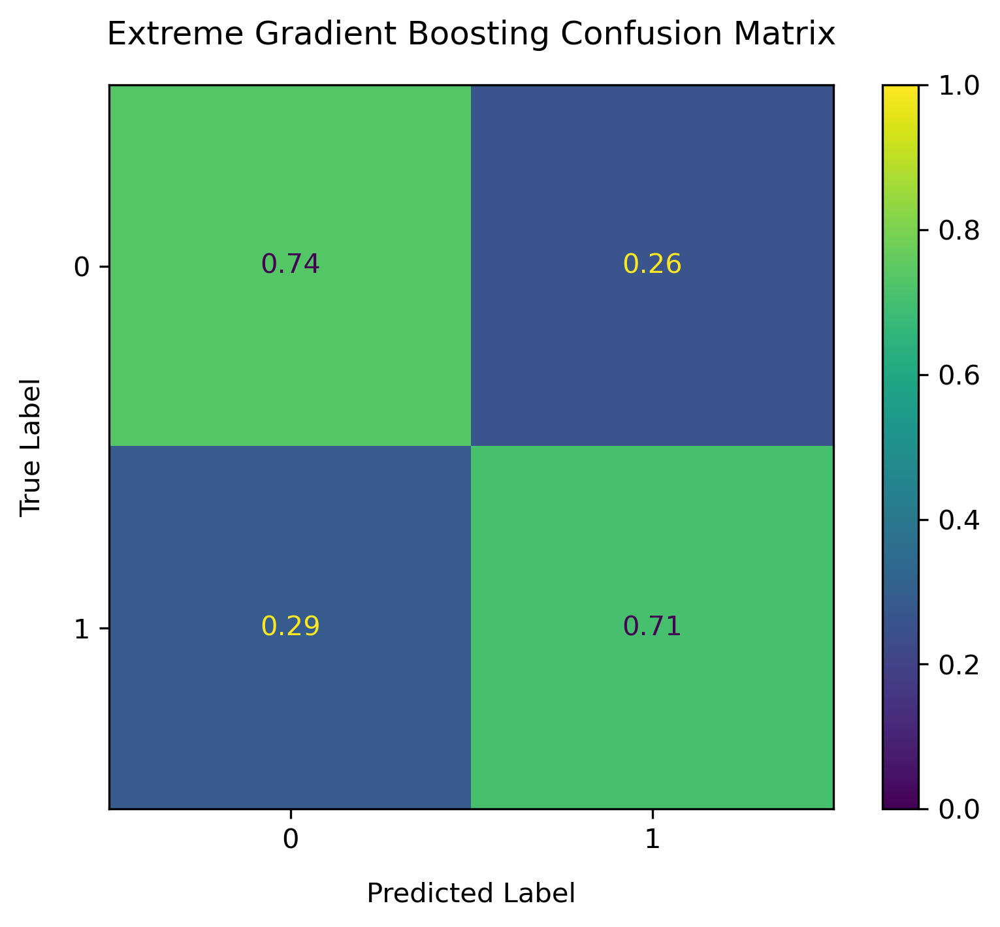

In [327]:
# printing the accuracy of the overall extreme gradient boosting prediction
print(f'Accuracy Score: {accuracy_score(y_true, y_pred):.2}')

# plotting the overall extreme gradient boosting prediction confusion matrix
plot_confusion(y_true, y_pred, [0, 1], model_name, scorer)

#### Test Set

In [328]:
# initializing the test feature matrix and target vector
X_test = processor.transform(xgb_results_a['test sets'][best_index][0])
X_test = pd.DataFrame(data=X_test, columns=processor.get_feature_names_out())

y_test = xgb_results_a['test sets'][best_index][1]

In [329]:
# initializing the feature names
feature_names = X_test.columns

#### Permutation

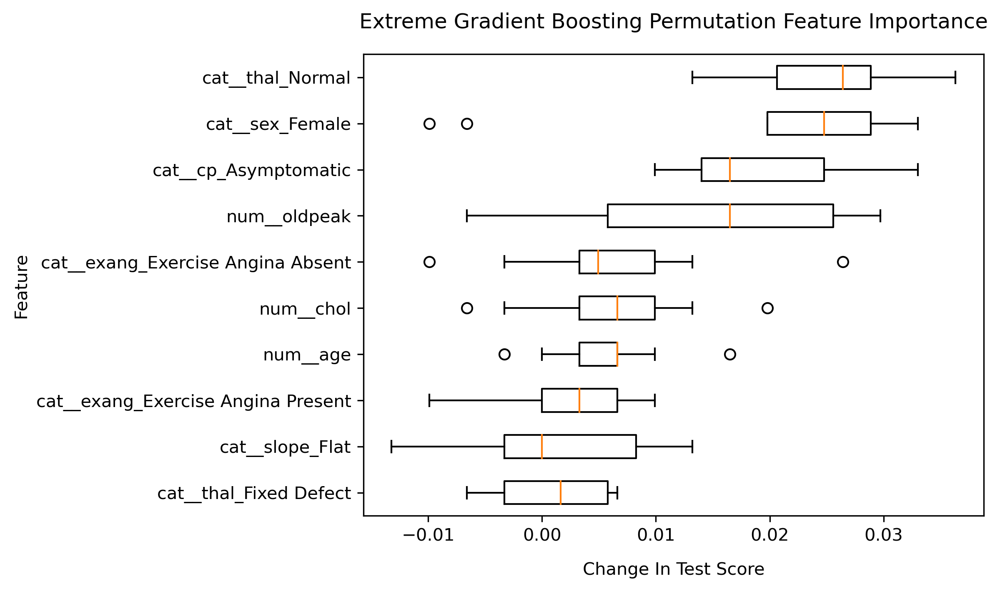

In [330]:
# plotting the top 10 most important features by feature importance
plot_permutation_im(estimator, X_test.to_numpy(), y_test.to_numpy(), model_name, scorer)

### XGBoost Metrics

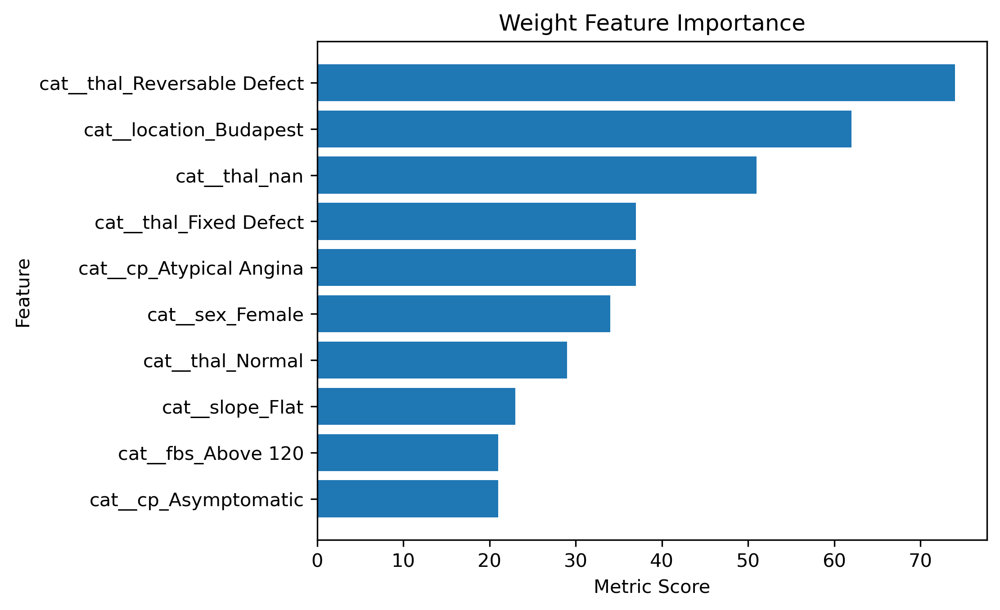

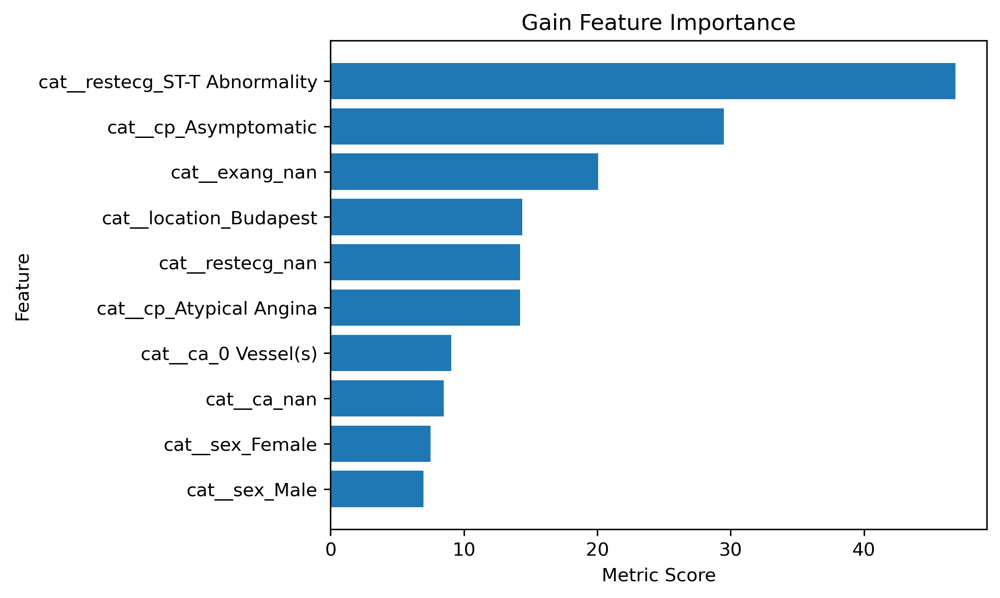

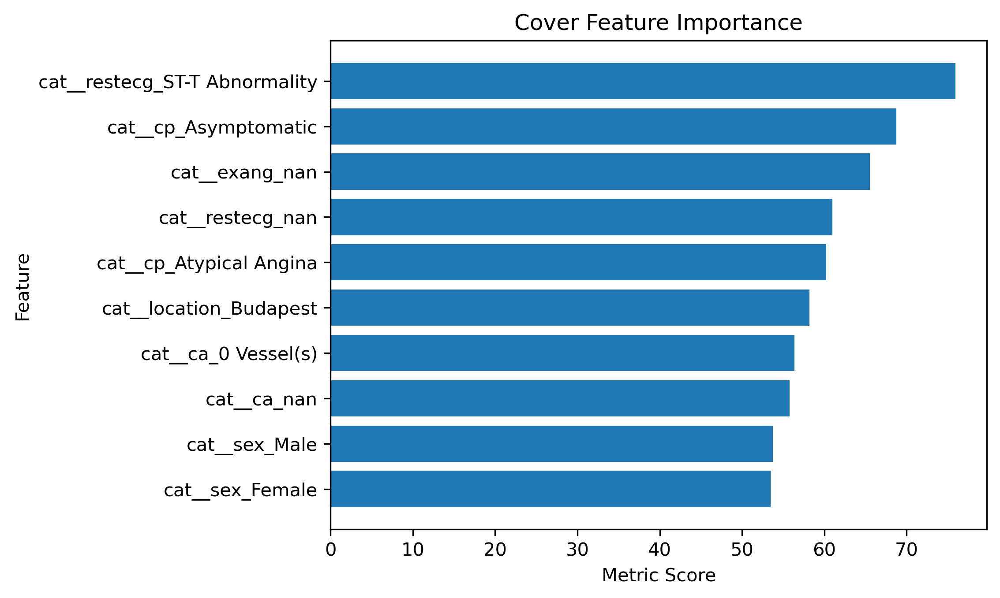

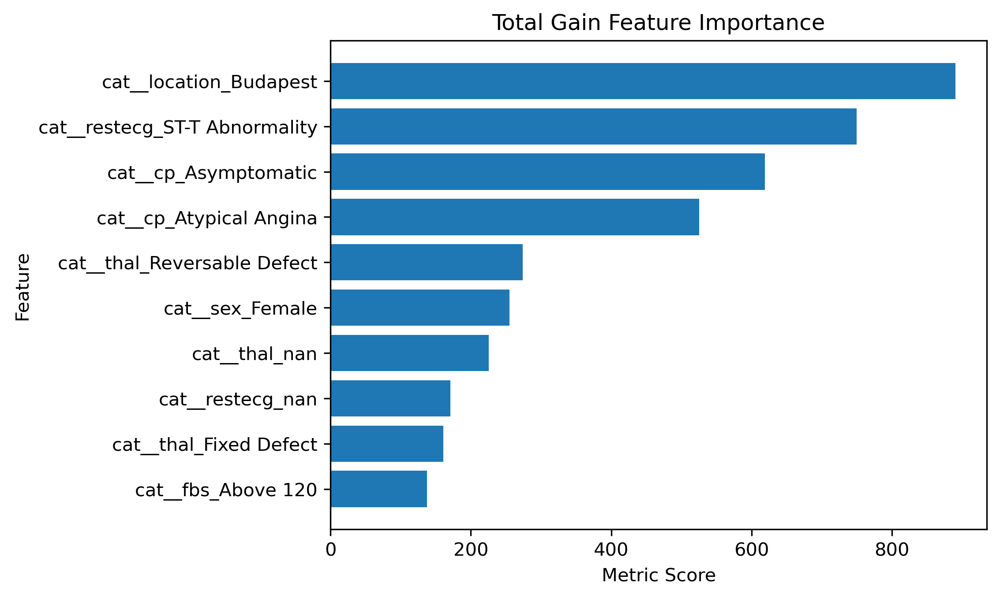

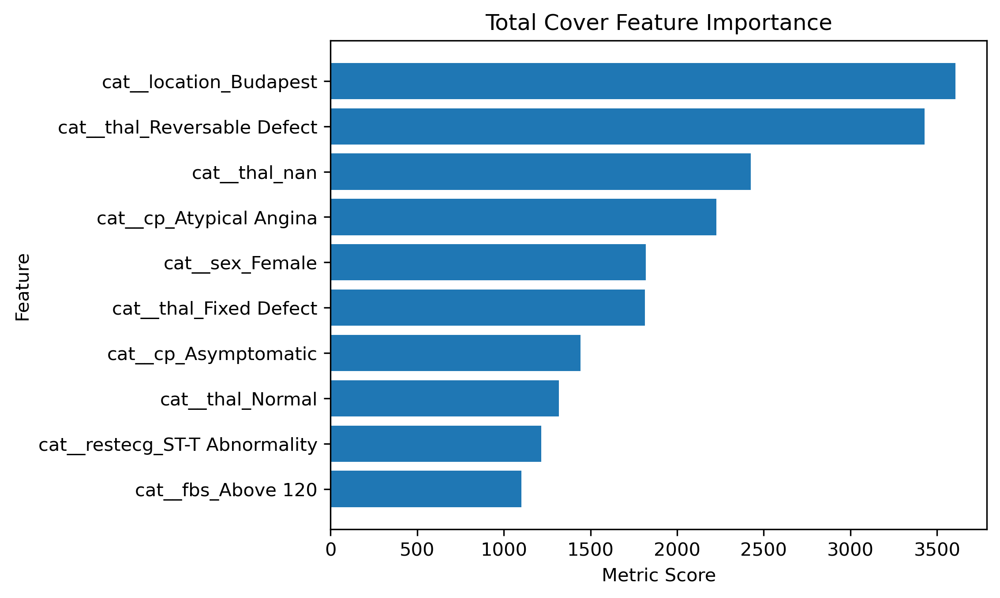

In [331]:
# initializing the XGBoost feature importance metrics
metrics = ['weight', 'gain', 'cover', 'total_gain', 'total_cover']

# plotting the top 10 most important features by metric
plot_xgboost_metrics_im(estimator, metrics, feature_names, model_name, scorer)

#### SHAP Global

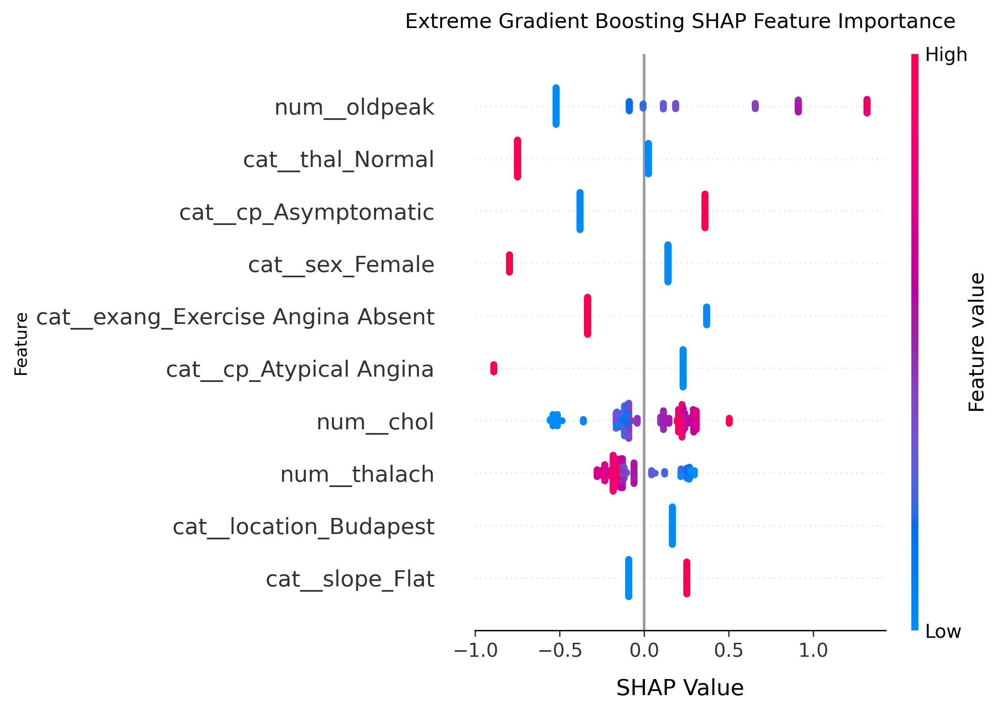

In [332]:
# initializing the shap explainer
explainer = shap.TreeExplainer(estimator)

# calculating the shap values
shap_values = explainer.shap_values(X_test)

# plotting a summary plot for the shap values
plot_shap_global_im_s(X_test, shap_values, feature_names, model_name, scorer)

#### SHAP Local

In [333]:
# printing the expected value of the explainer
print(f'Base Value: {explainer.expected_value:.2}')

Base Value: 0.094


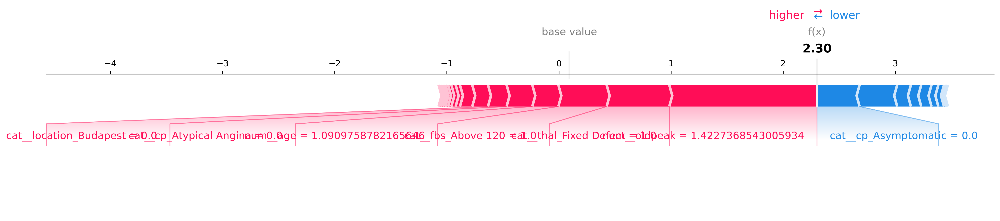

In [334]:
# initializing the index of the data point
index = 0

# plotting a force plot for the data point at the initialized index
shap.force_plot(explainer.expected_value, shap_values[index, :], features=X_test.iloc[index, :], feature_names=feature_names, 
                show=False, matplotlib=True).savefig(f'../figures/evaluation_figures/{model_name}/shap_{index}_{scorer}.png', bbox_inches='tight')

plt.show()

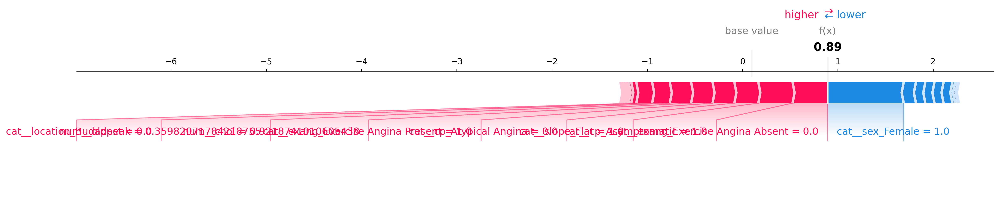

In [335]:
# initializing the index of the data point
index = 60

# plotting a force plot for the data point at the initialized index
shap.force_plot(explainer.expected_value, shap_values[index, :], features=X_test.iloc[index, :], feature_names=feature_names, 
                show=False, matplotlib=True).savefig(f'../figures/evaluation_figures/{model_name}/shap_{index}_{scorer}.png', bbox_inches='tight')

plt.show()

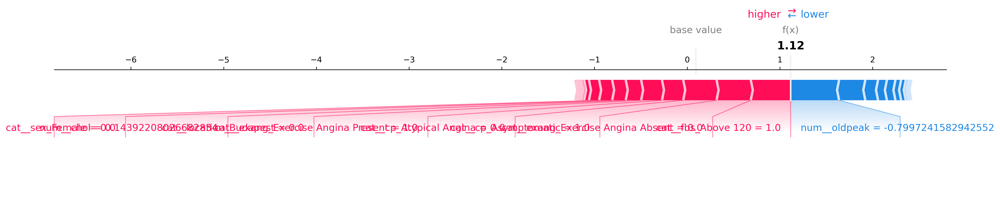

In [336]:
# initializing the index of the data point
index = 120

# plotting a force plot for the data point at the initialized index
shap.force_plot(explainer.expected_value, shap_values[index, :], features=X_test.iloc[index, :], feature_names=feature_names, 
                show=False, matplotlib=True).savefig(f'../figures/evaluation_figures/{model_name}/shap_{index}_{scorer}.png', bbox_inches='tight')

plt.show()

### F1 Score

In [337]:
# initializing the scorer
scorer = 'f'

In [338]:
# initializing the extreme gradient boosting results
with open('../results/extreme_gradient_boosting/extreme_gradient_boosting_f.pkl', 'rb') as f:
    xgb_results_f = pickle.load(f)

# initializing the best extreme gradient boosting model
best_index = np.argmax(xgb_results_f['test scores'])
best_model = xgb_results_f['best models'][best_index]

processor = best_model.named_steps['columntransformer']
estimator = best_model.named_steps['xgbclassifier']

In [339]:
print(processor)

ColumnTransformer(transformers=[('cat',
                                 Pipeline(steps=[('onehot',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False))]),
                                 ['sex', 'cp', 'fbs', 'restecg', 'exang',
                                  'slope', 'ca', 'thal', 'location']),
                                ('num',
                                 Pipeline(steps=[('scaler', StandardScaler())]),
                                 ['age', 'trestbps', 'chol', 'thalach',
                                  'oldpeak'])])


In [340]:
print(estimator)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.9, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.03, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=1, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=500, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=0, ...)


In [341]:
# initializing the overall test results of the extreme gradient boosting model
xgb_test_results_f = overall_test_results(xgb_results_f['best models'], xgb_results_f['test sets'], 'xgbclassifier')

y_true = xgb_test_results_f['y true']
y_pred = xgb_test_results_f['y pred']

In [342]:
# saving the overall test predictions of the extreme gradient boosting model
y_pred.to_csv(f'../results/{model_name}/{model_name}_prediction_{scorer}.csv', index=False)

#### Confusion Matrix

F1 Score: 0.74


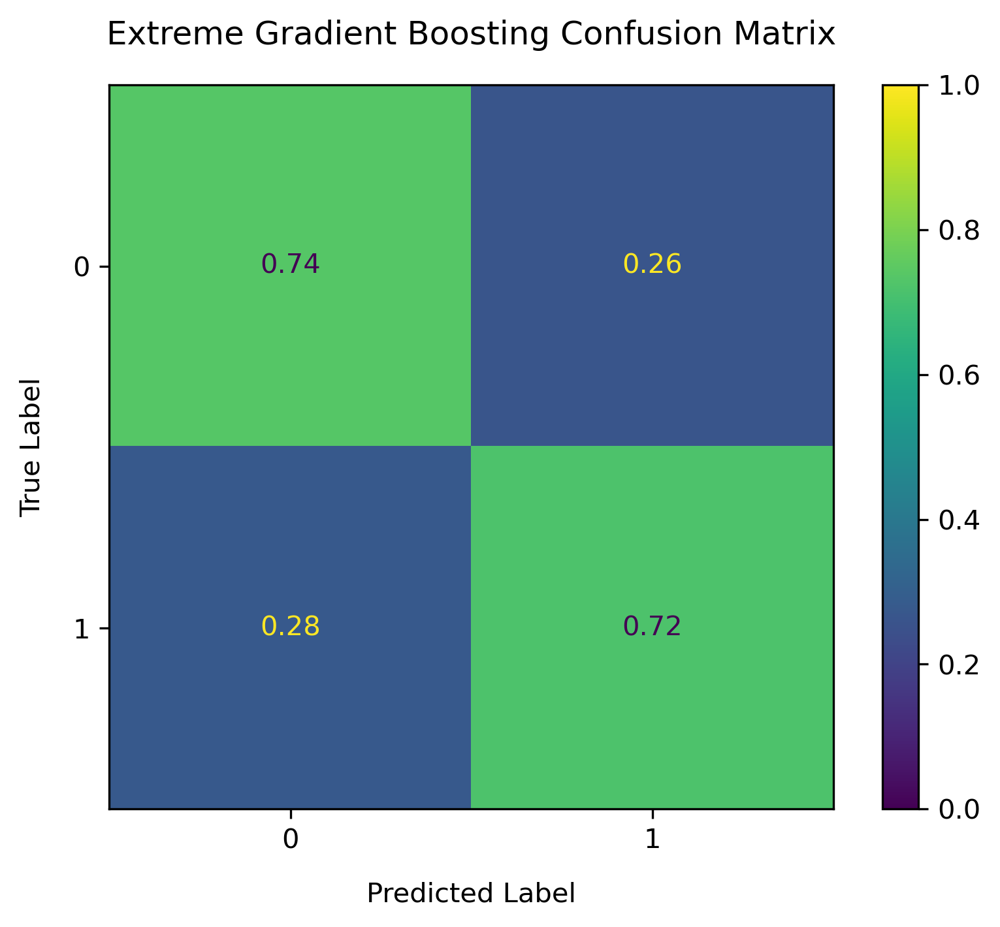

In [343]:
# printing the accuracy of the overall extreme gradient boosting model prediction
print(f'F1 Score: {f1_score(y_true, y_pred):.2}')

# plotting the overall extreme gradient boosting model prediction confusion matrix
plot_confusion(y_true, y_pred, [0, 1], model_name, scorer)

#### Test Set

In [344]:
# initializing the test feature matrix and target vector
X_test = processor.transform(xgb_results_f['test sets'][best_index][0])
X_test = pd.DataFrame(data=X_test, columns=processor.get_feature_names_out())

y_test = xgb_results_f['test sets'][best_index][1]

In [345]:
# initializing the feature names
feature_names = X_test.columns

#### Permutation

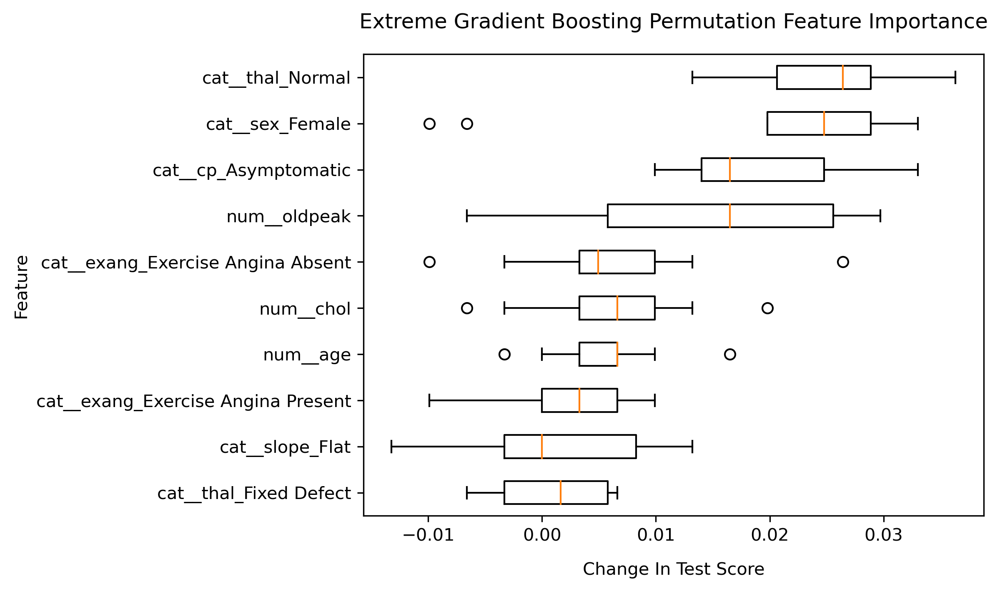

In [346]:
# plotting the top 10 most important features by feature importance
plot_permutation_im(estimator, X_test.to_numpy(), y_test.to_numpy(), model_name, scorer)

### XGBoost Metrics

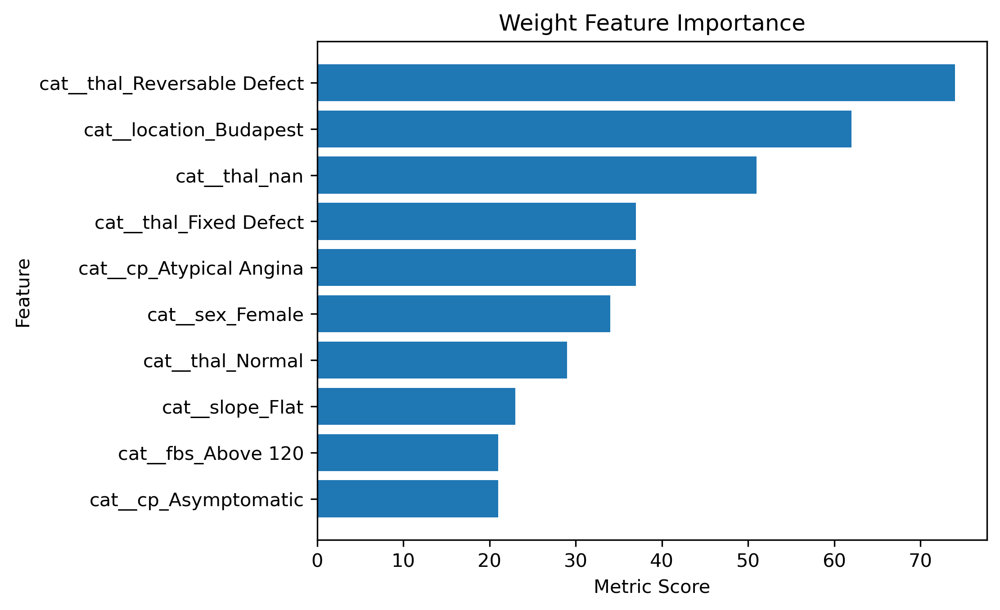

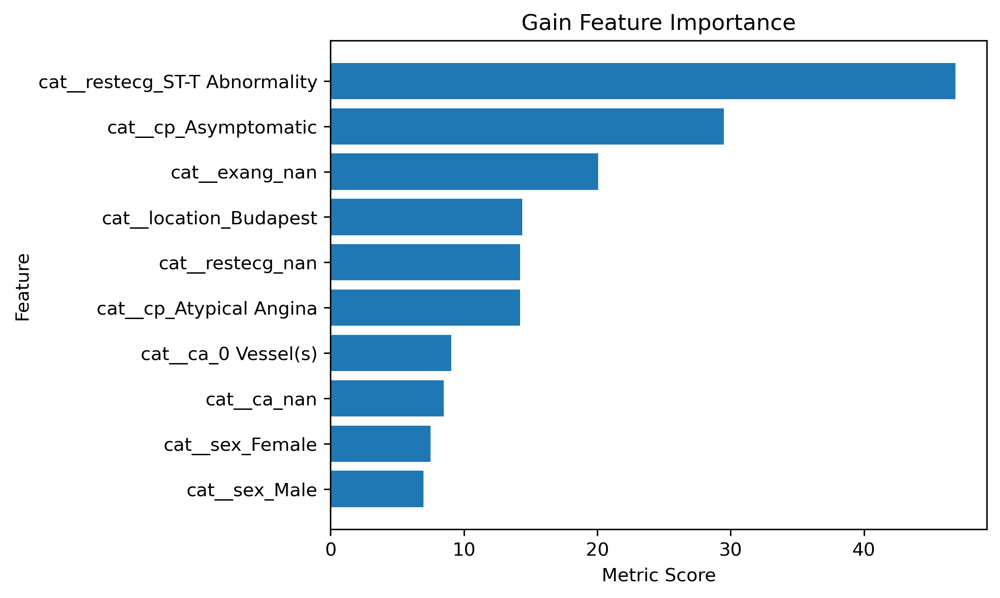

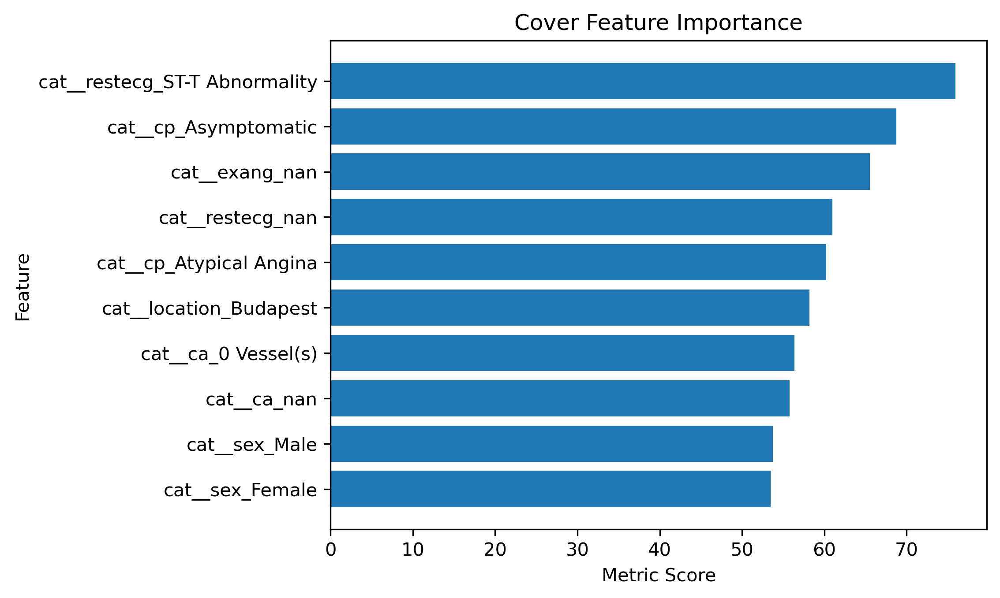

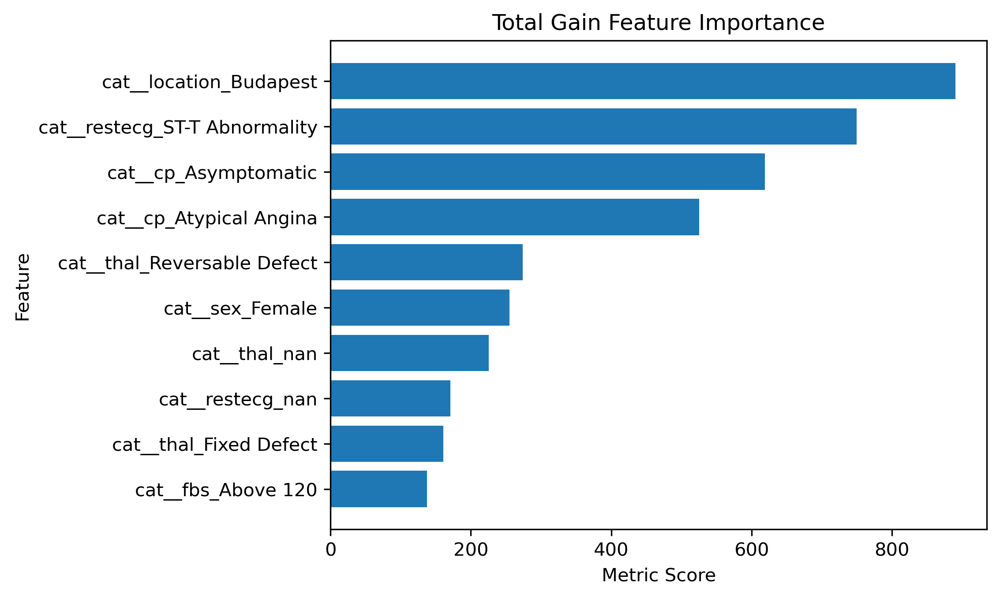

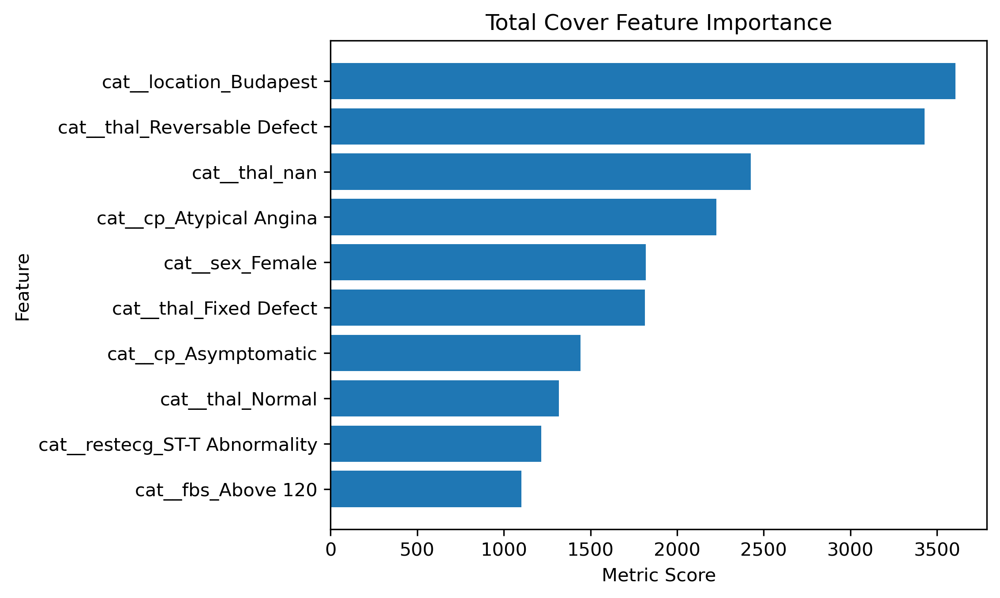

In [347]:
# initializing the XGBoost feature importance metrics
metrics = ['weight', 'gain', 'cover', 'total_gain', 'total_cover']

# plotting the top 10 most important features by metric
plot_xgboost_metrics_im(estimator, metrics, feature_names, model_name, scorer)

#### SHAP Global

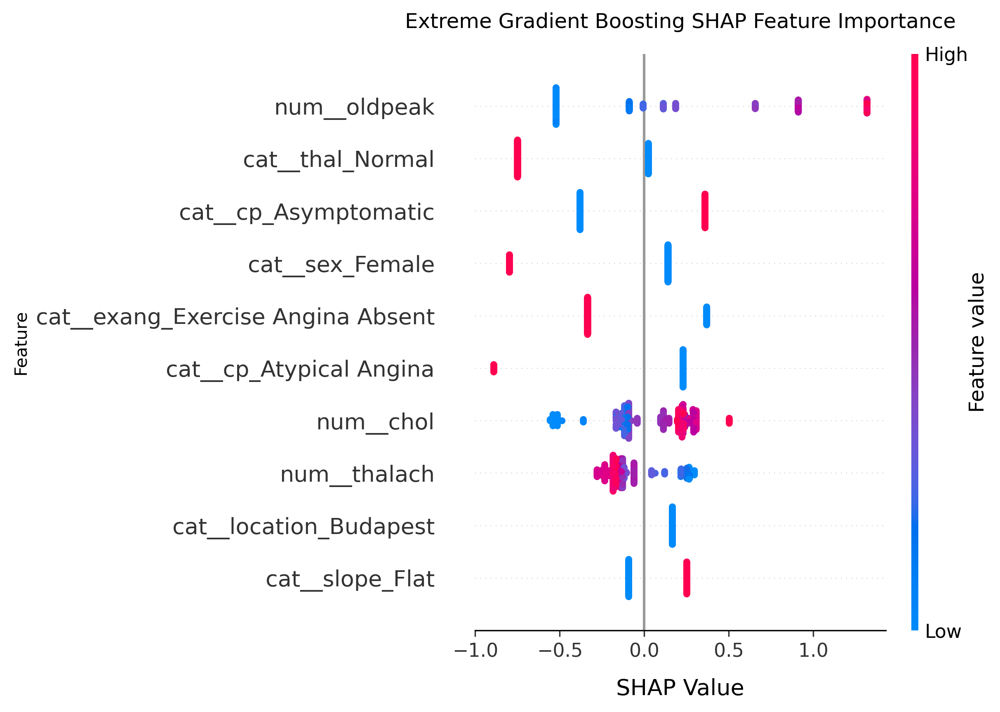

In [348]:
# initializing the shap explainer
explainer = shap.TreeExplainer(estimator)

# calculating the shap values
shap_values = explainer.shap_values(X_test)

# plotting a summary plot for the shap values
plot_shap_global_im_s(X_test, shap_values, feature_names, model_name, scorer)

#### SHAP Local

In [349]:
# printing the expected value of the explainer
print(f'Base Value: {explainer.expected_value:.2}')

Base Value: 0.094


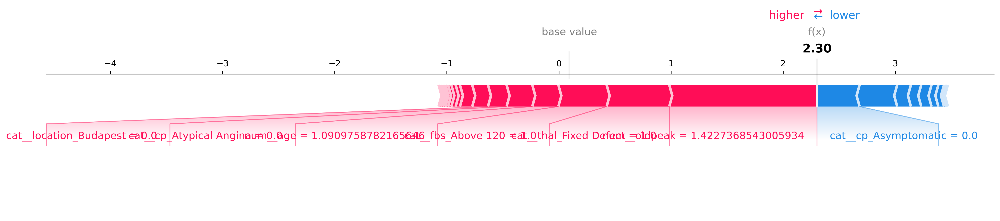

In [350]:
# initializing the index of the data point
index = 0

# plotting a force plot for the data point at the initialized index
shap.force_plot(explainer.expected_value, shap_values[index, :], features=X_test.iloc[index, :], feature_names=feature_names, 
                show=False, matplotlib=True).savefig(f'../figures/evaluation_figures/{model_name}/shap_{index}_{scorer}.png', bbox_inches='tight')

plt.show()

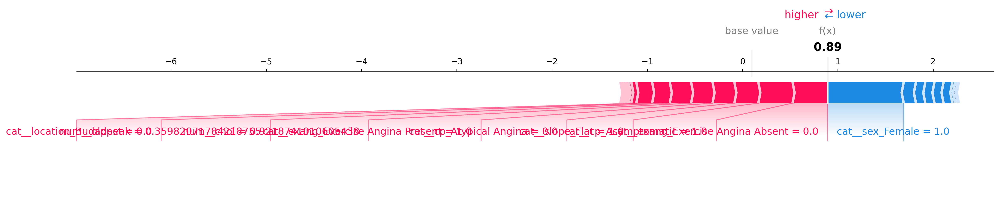

In [351]:
# initializing the index of the data point
index = 60

# plotting a force plot for the data point at the initialized index
shap.force_plot(explainer.expected_value, shap_values[index, :], features=X_test.iloc[index, :], feature_names=feature_names, 
                show=False, matplotlib=True).savefig(f'../figures/evaluation_figures/{model_name}/shap_{index}_{scorer}.png', bbox_inches='tight')

plt.show()

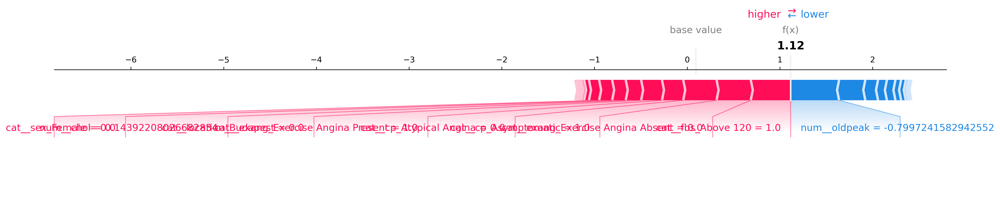

In [352]:
# initializing the index of the data point
index = 120

# plotting a force plot for the data point at the initialized index
shap.force_plot(explainer.expected_value, shap_values[index, :], features=X_test.iloc[index, :], feature_names=feature_names, 
                show=False, matplotlib=True).savefig(f'../figures/evaluation_figures/{model_name}/shap_{index}_{scorer}.png', bbox_inches='tight')

plt.show()